In [5]:
from dolfin import *
import matplotlib.pyplot as plt
from numpy.polynomial.legendre import leggauss
import numpy as np
from ufl import tanh
import functions as f 
from fenics import File

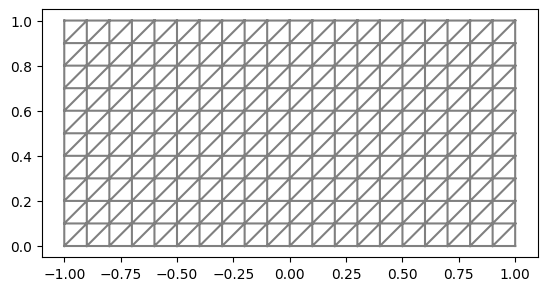

In [6]:
mesh = RectangleMesh(Point(-1.0,0.0),Point(1.0,1.0),20,10)
plot(mesh)

In [3]:
class VerticalAverage(UserExpression):
    def __init__(self, f, quad_degree, **kwargs):
        super().__init__(**kwargs)
        self.f = f
        self.points, self.weights = leggauss(quad_degree)
        self.x = 0.5*(self.points + 1)
        assert f.ufl_shape == ()
        
    def eval(self, values, x):
        values[0] = 0.5*sum(wq*self.f(x[0], xq) for xq, wq in zip(self.x, self.weights))

    def value_shape(self):
        return ()

In [4]:
boundary_markers = MeshFunction('size_t', mesh,1)
subdomains_markers = MeshFunction('size_t', mesh,2)

class BoundaryX0(SubDomain):
    tol = 1E-14
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], -1, 1E-14)

bx0 = BoundaryX0()
bx0.mark(boundary_markers, 3)

class BoundaryX1(SubDomain):
    tol = 1E-14
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 1, 1E-14)

bx1 = BoundaryX1()
bx1.mark(boundary_markers, 1)

class BoundaryY1(SubDomain):
    tol = 1E-14
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 1, 1E-14)

by1 = BoundaryY1()
by1.mark(boundary_markers, 2)

class BoundaryY0(SubDomain):
    tol = 1E-14
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0, 1E-14)

by0 = BoundaryY0()
by0.mark(boundary_markers, 0)

class Omega_CSC(SubDomain):
    def inside(self, x, on_boundary):
        return x[1] <= 0.3 + 1E-14

class Omega_DC(SubDomain):
    def inside(self, x, on_boundary): 
        return x[1] > 0.3 - 1E-14 and x[1] <= 0.8 + 1E-14
    
class Omega_TDC(SubDomain):
    def inside(self, x, on_boundary): 
        return x[1] > 0.8 - 1E-14
    
subdomain_CSC = Omega_CSC()
subdomain_DC = Omega_DC()
subdomain_TDC = Omega_TDC()
subdomain_CSC.mark(subdomains_markers, 0)
subdomain_DC.mark(subdomains_markers, 1)
subdomain_TDC.mark(subdomains_markers, 3)

ds = Measure("ds",domain=mesh, subdomain_data=boundary_markers)
dx = Measure("dx",domain=mesh, subdomain_data=subdomains_markers)

In [5]:
params = {'Dxc': 4.32*1e3,
          'gamma' : 4*4.32*1e3,
          'K_m' : 0.0125,
          'Dxn' : 2.4*1e-3,
          'Dsn' : 1.2*1e-4,
          'p_csc' : 0.12,
          'p_dc' : 0.48,
          'K_csc' : 0.05,
          'K_dc' : 0.3, 
          'g_csc' : 0.1,
          'g_dc' : 0.2,
          'g_tdc' : 0.1,
          's_csc' : 0,
          's_dc' : 0.55,
          'epsilon' : 0.05,
          'epsilon_k' : 0.01,
          'V_plus' : 1.92*1e-2,
          'V_minus' : 0.48*1e-2,
          'csi_plus' : 0.1,
          'csi_minus' : 0.1,
          'c_H' : 0.3,
          'c_N' : 0.0125,
          'c_R' : 0.1,
          'd_tdc' : 0.024,
          'd_n' : 2.4,
          'OER' : 3,
          'alpha_min' : 0.007,
          'delta_alpha' : 0.143,
          'beta_min' : 0.002,
          'delta_beta' : 0.018,
          'k' : 1e3,
          's0' : 0.5,
          'sigma' : sqrt(0.02)
          }

In [3]:
m0 = 1e-4
dt = 0.1
T = 150
save_interval = 10
nsteps = int(T/dt)

In [7]:
V = FunctionSpace(mesh,"P",2)
N = Function(V)
C = Function(V)
n = TrialFunction(V)
v = TestFunction(V)
c = TrialFunction(V)
w = TestFunction(V)

# initial cell distribution
n0 = Expression("m0/(pow(2*pi,0.5)*sigma)*exp(-pow(x[1]-s0,2)/(2*sigma*sigma))",m0 = m0,s0 = params['s0'],sigma=params['sigma'],degree=2)
n0 = interpolate(n0,V)

c_k = interpolate(Constant(1.0), V)
f = Constant(0.0)
L_c = f*w*dx
bc_c1 = DirichletBC(V,Constant(1.0),bx1)
bc_c2 = DirichletBC(V,Constant(1.0),bx0)
bcs_c = [bc_c1,bc_c2]

mass = []
n_vect = []
c_vect = []
phi_vect = []

t=0
i=0

nfile = XDMFFile('solutions/non_sym/N1e-4.xdmf')
cfile = XDMFFile('solutions/non_sym/C1e-4.xdmf')
nfile.parameters['rewrite_function_mesh'] = False
cfile.parameters['rewrite_function_mesh'] = False

while(t<nsteps):
    print('time=%g: ' %(t*dt))

    # update phi
    phi = VerticalAverage(n0, quad_degree=20, degree=2)
    phi_h = interpolate(phi, V)
    a_c = params['Dxc'] * inner(grad(c)[0],grad(w)[0])*dx + params['gamma']/(c_k + params['K_m'])*phi_h*c*w*dx
    
    # fixed point -> solve c
    eps= 1.0
    tol = 1.0E-3    
    iter = 0        
    maxiter = 30    
    while eps > tol and iter < maxiter:
        iter += 1
        solve(a_c==L_c,C,bcs_c)
        difference = C.vector() - c_k.vector()
        eps = np.linalg.norm(difference) / np.linalg.norm(c_k.vector())
        print('iter=%d: norm=%g' % (iter, eps))
        c_k.assign(C) 

    if t % save_interval == 0:
        n_vect.append(n0.vector().get_local().copy())
        c_vect.append(C.vector().get_local().copy())
        phi_vect.append(phi_h)

        nfile.write_checkpoint(n0,"n",t,XDMFFile.Encoding.HDF5, True)
        cfile.write_checkpoint(C,"c",t,XDMFFile.Encoding.HDF5, True)

    mass.append(assemble(phi_h*dx))

    # solve n
    P = Expression('(p_csc*pow(c,4)/(pow(K_csc,4)+pow(c,4))*exp(-pow((x[1]-s_csc)/g_csc,2)) \
            + p_dc*pow(c,4)/(pow(K_dc,4)+pow(c,4))*exp(-pow((x[1]-s_dc)/g_dc,2)))*(1-phi)',
            p_csc=params['p_csc'],p_dc=params['p_dc'],K_csc=params['K_csc'],K_dc=params['K_dc'], 
            g_csc=params['g_csc'],g_dc=params['g_dc'],s_csc=params['s_csc'],s_dc=params['s_dc'],phi=phi_h,c=C,degree=2)
    K = Expression('d_tdc * exp(-((1-x[1])/g_tdc)) + d_n * (0.5+0.5*tanh(pow(epsilon_k,-1)*(c_N-c)))',
            d_tdc=params['d_tdc'],d_n=params['d_n'],g_tdc=params['g_tdc'],epsilon_k=params['epsilon_k'],c_N=params['c_N'],c=C,degree=2)
    
    vs = Expression('V_plus*tanh(x[1]/csi_plus)*tanh((1-x[1])/csi_plus)*(0.5+0.5*tanh((c-c_H)*pow(epsilon,-1))) \
                - V_minus*tanh(x[1]/csi_minus)*tanh(pow(1-x[1],2)/csi_minus)*(0.5+0.5*tanh((c_H-c)*pow(epsilon,-1)))',
                V_plus=params['V_plus'],V_minus=params['V_minus'],csi_minus=params['csi_minus'],csi_plus=params['csi_plus'],
                c_H=params['c_H'],epsilon=params['epsilon'],c=C,degree=2)
    vs = interpolate(vs,V)

    F = Expression("P - K", degree=2, P=P, K=K)

    a_n = n*v*dx + dt*params['Dxn']*inner(grad(n)[0],grad(v)[0])*dx + dt*params['Dsn']*inner(grad(n)[1],grad(v)[1])*dx + dt*grad(vs*n)[1]*v*dx \
        - dt*n*v*F*dx + dt*n*v*vs*ds(0) - dt*n*v*vs*ds(2) 
    L_n = n0*v*dx

    solve(a_n==L_n,N)
    n0.assign(N)

    t+=1

np.save('solutions/non_sym/mass_nonsym1e-4.npy',mass)

time=0: 
Solving linear variational problem.
iter=1: norm=0.000142292
Solving linear variational problem.
time=0.1: 
Solving linear variational problem.
iter=1: norm=4.84384e-06
time=0.2: 
Solving linear variational problem.
Solving linear variational problem.
iter=1: norm=5.02592e-06
Solving linear variational problem.
time=0.3: 
Solving linear variational problem.
iter=1: norm=5.23842e-06
time=0.4: 
Solving linear variational problem.
Solving linear variational problem.
iter=1: norm=5.45998e-06
time=0.5: 
Solving linear variational problem.
Solving linear variational problem.
iter=1: norm=5.69095e-06
Solving linear variational problem.
time=0.6: 
Solving linear variational problem.
iter=1: norm=5.9317e-06
Solving linear variational problem.
time=0.7: 
Solving linear variational problem.
iter=1: norm=6.18264e-06
Solving linear variational problem.
time=0.8: 
Solving linear variational problem.
iter=1: norm=6.44416e-06
Solving linear variational problem.
time=0.9: 
Solving linear varia

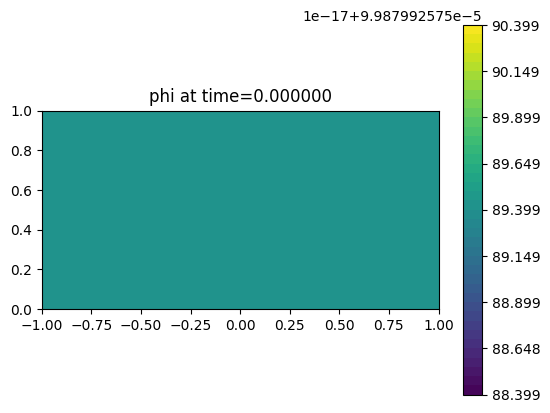

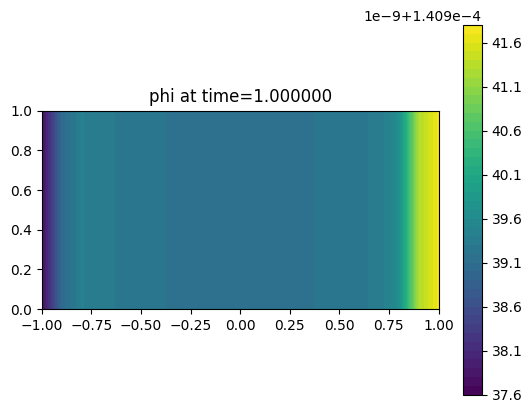

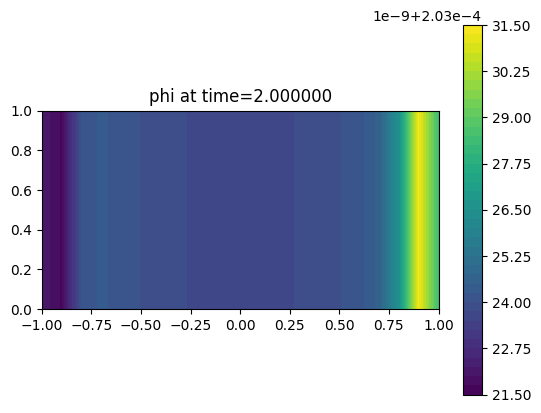

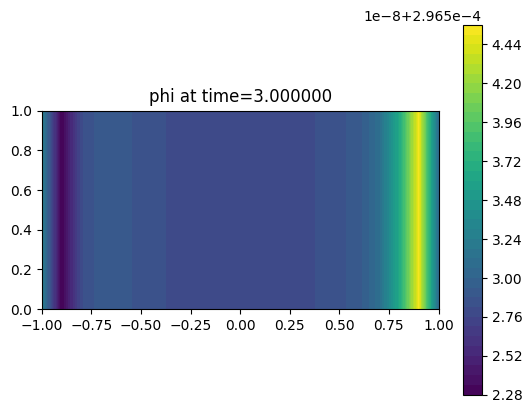

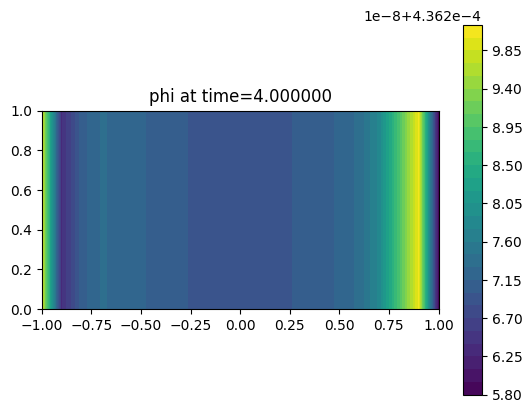

...

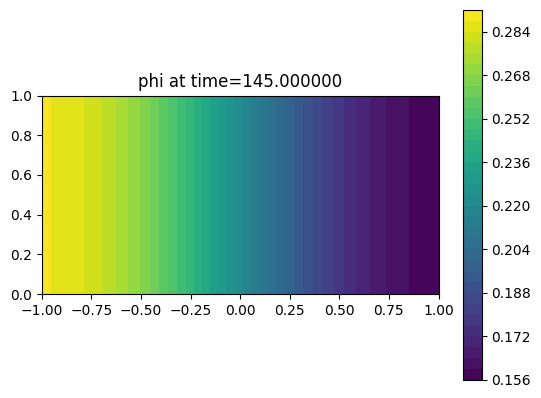

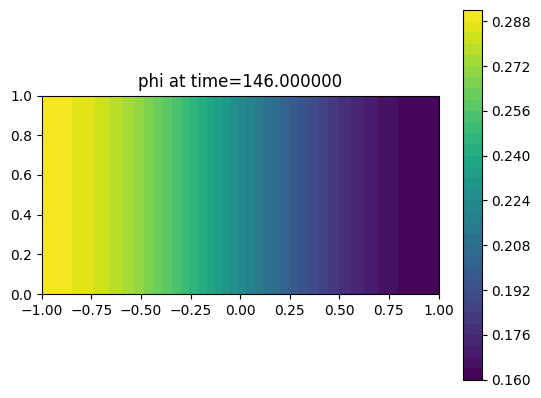

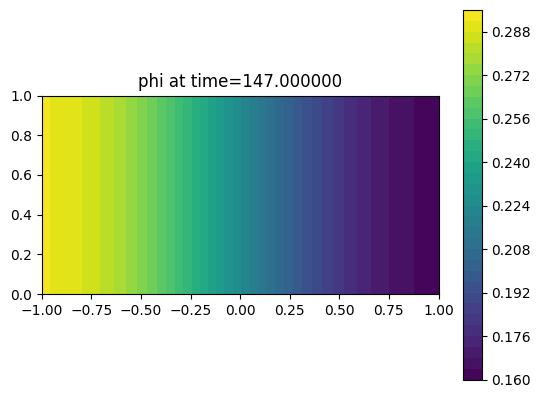

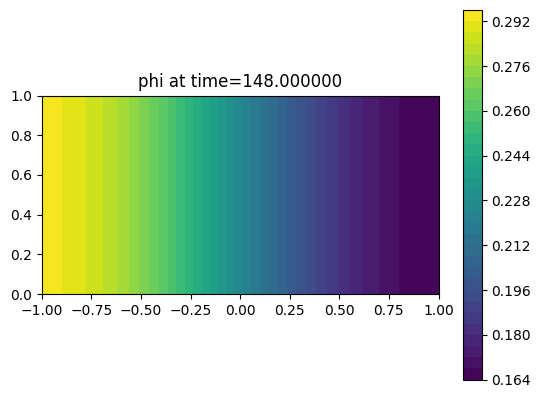

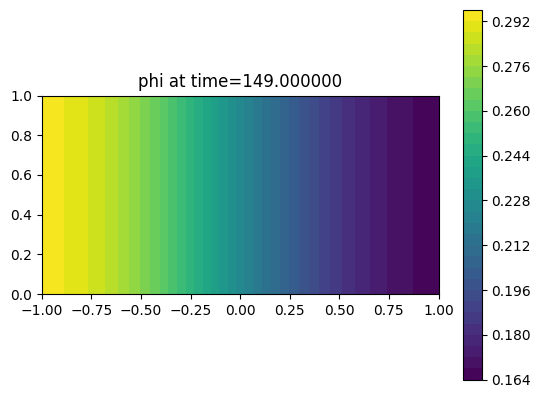

In [13]:
for i,phi in enumerate(phi_vect):
    sol = plot(phi)
    plt.colorbar(sol)
    plt.title('phi at time=%f'  %(i*save_interval*dt))
    plt.show()

Text(0.5, 0, 'time [days]')

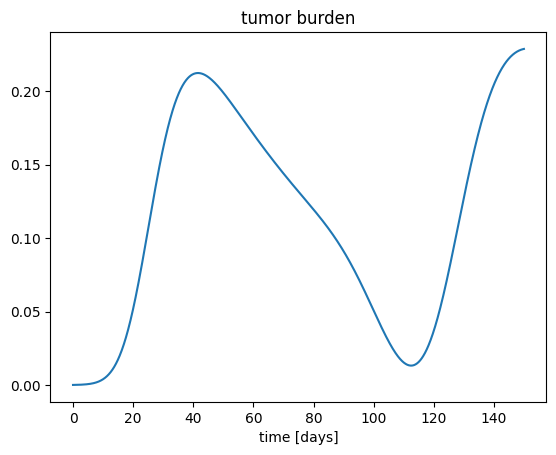

In [8]:
mass = np.load('solutions/non_sym/mass_nonsym1e-4.npy')
mass/=2
time = np.linspace(0,T,int(T/dt))
plt.plot(time,mass)
plt.title('tumor burden')
plt.xlabel('time [days]')

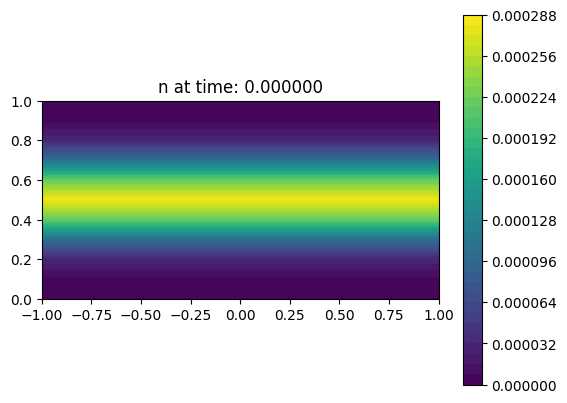

0.00019991777828460837


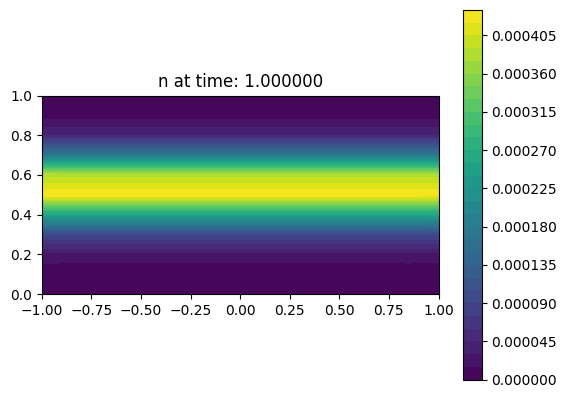

0.00028232651678311576


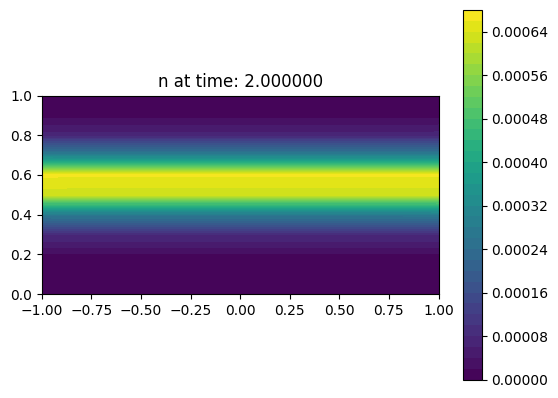

0.0004065850147898221


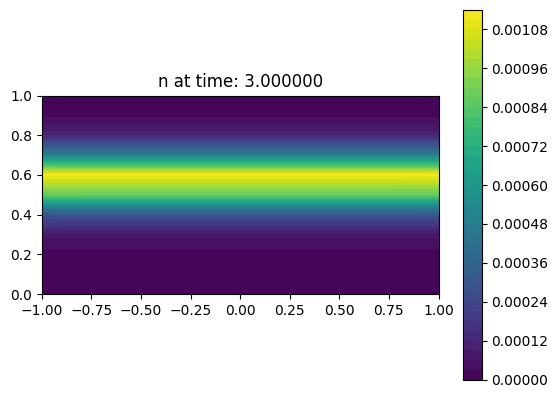

0.0005930140367477015


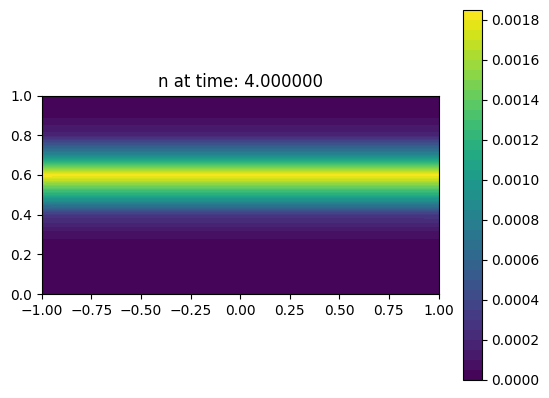

0.0008705690209087935


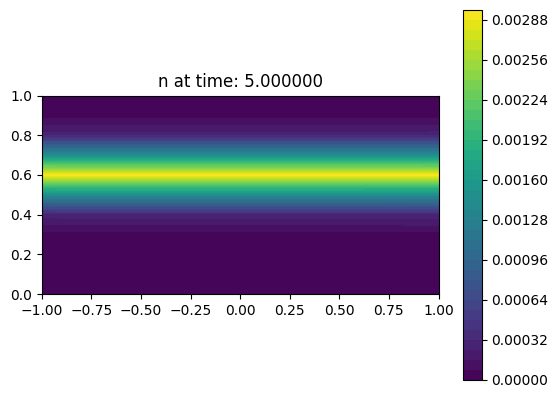

0.0012796057807613725


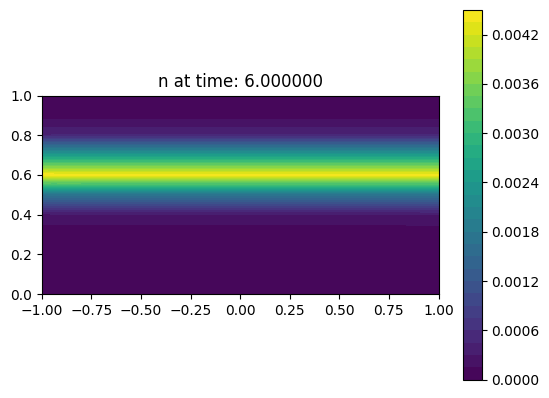

0.0018750255935819108


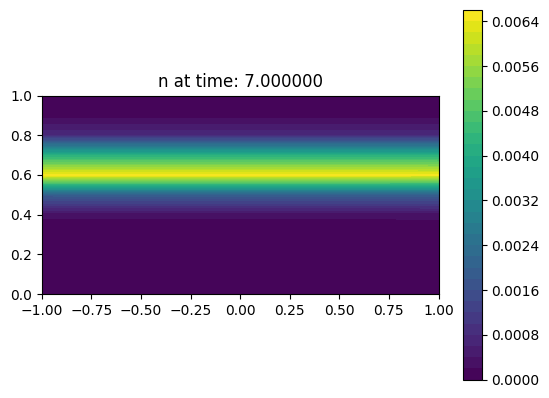

0.0027296001288125873


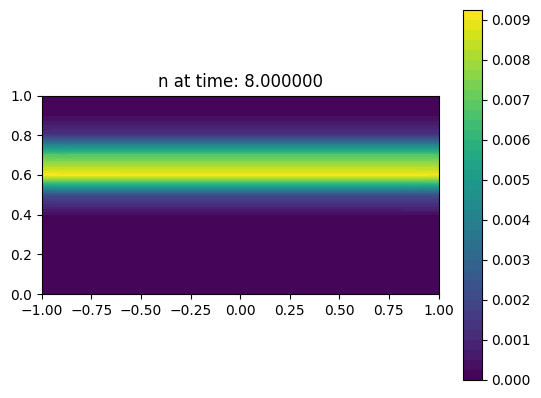

0.003937147105998662


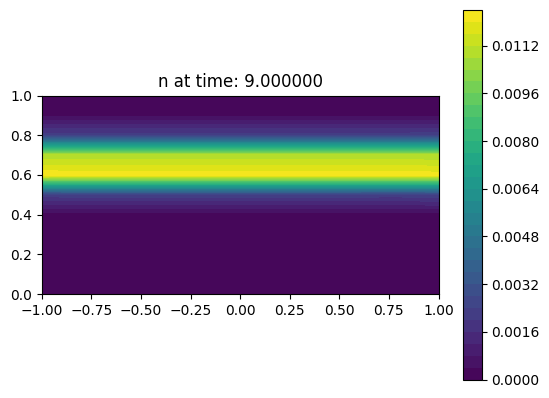

0.005615091660327194


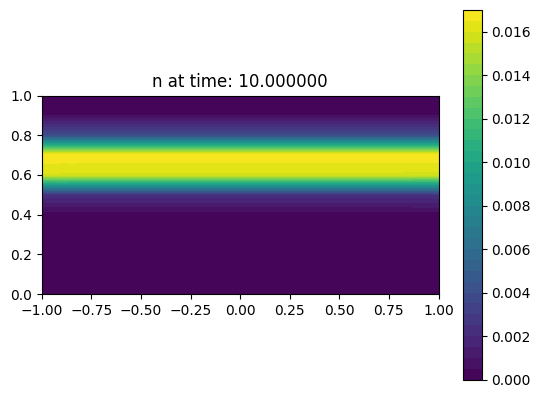

0.007905828510014687


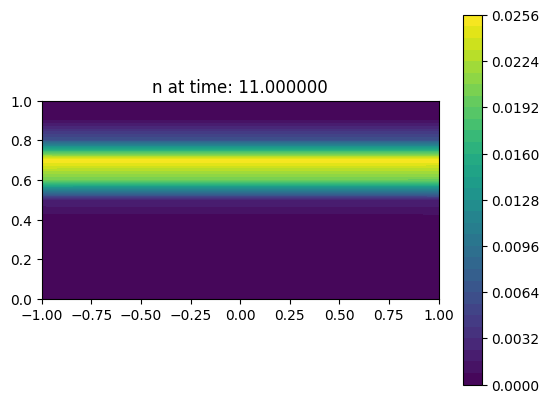

0.010976225124469685


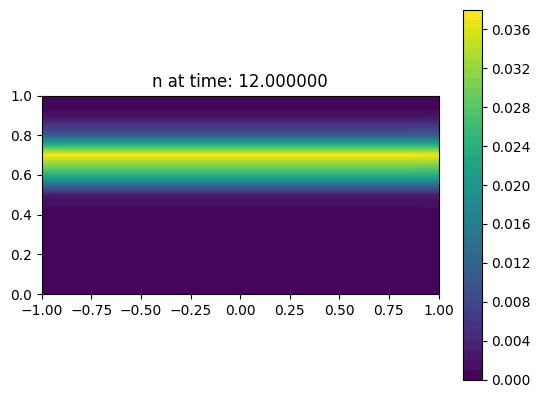

0.01501460881527109


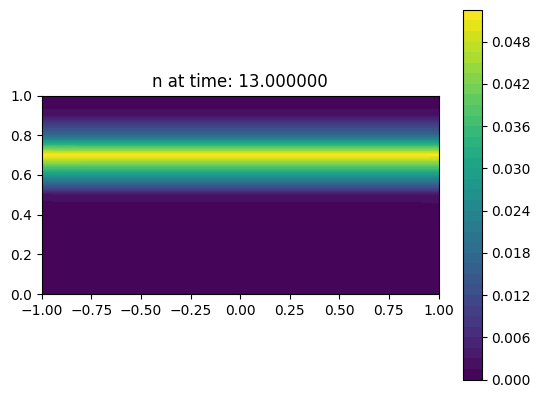

0.020224692322188962


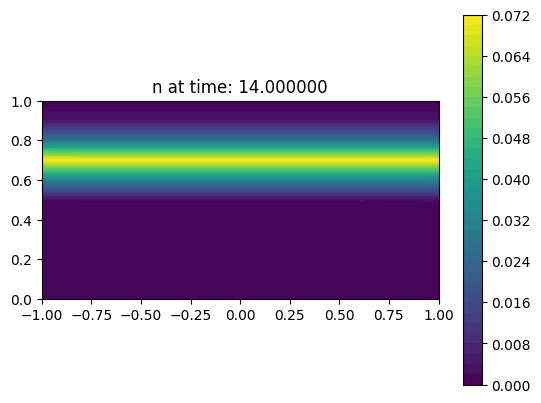

0.026816135730182995


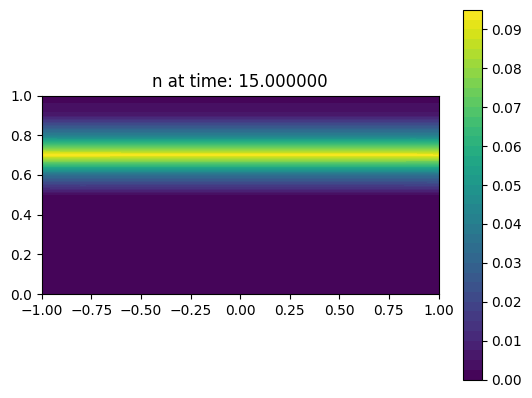

0.03499182218031344


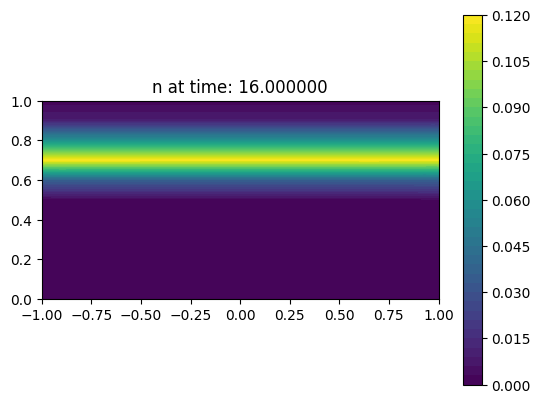

0.044932417768295776


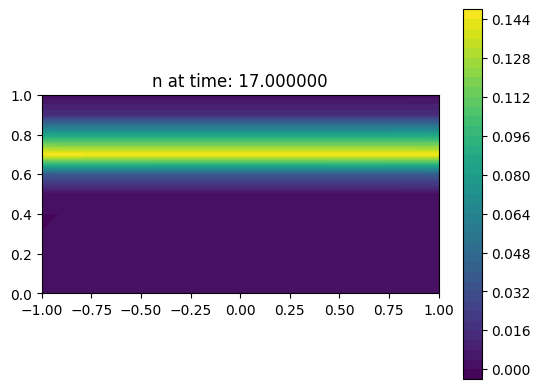

0.05677933407804262


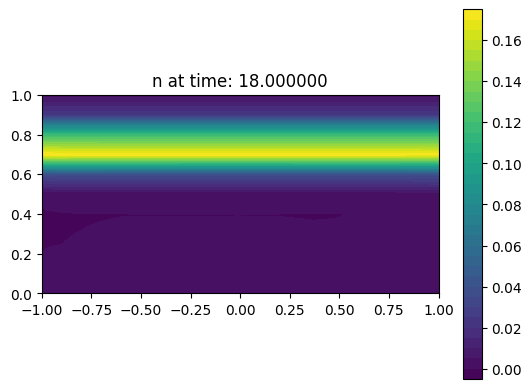

0.07061770858302181


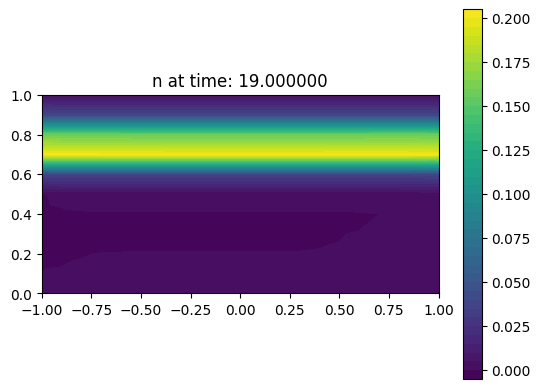

0.08646140835020319


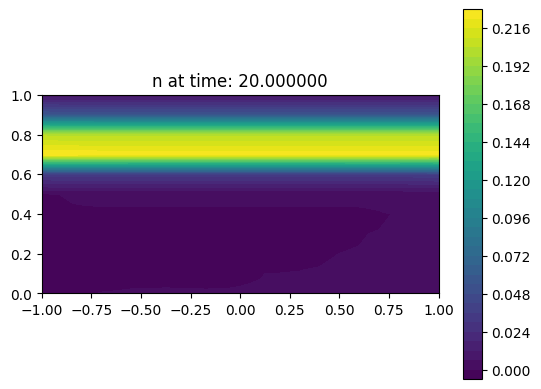

0.10424215370838606


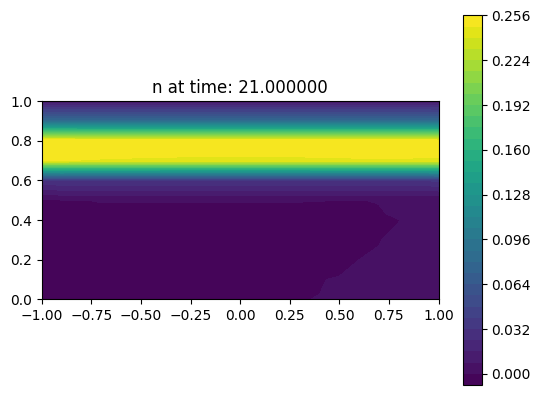

0.12380443660053563


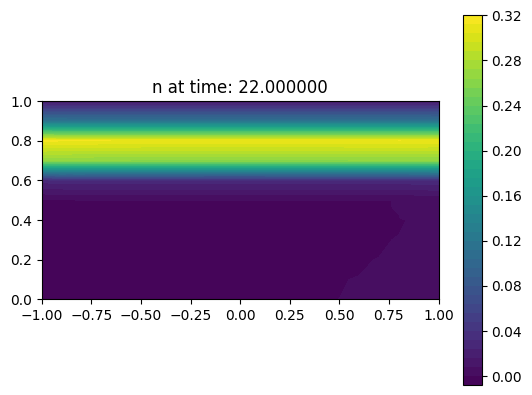

0.14490754113842233


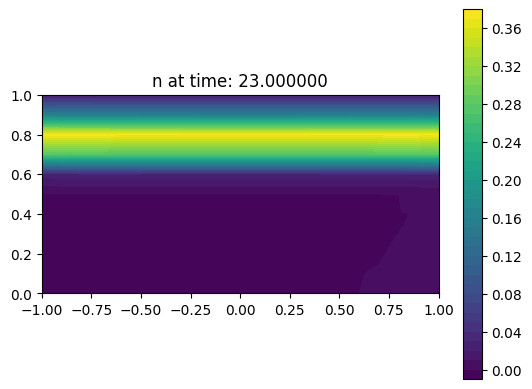

0.16723486936964624


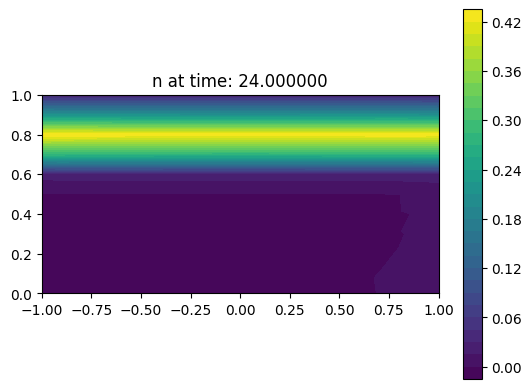

0.19040984010288345


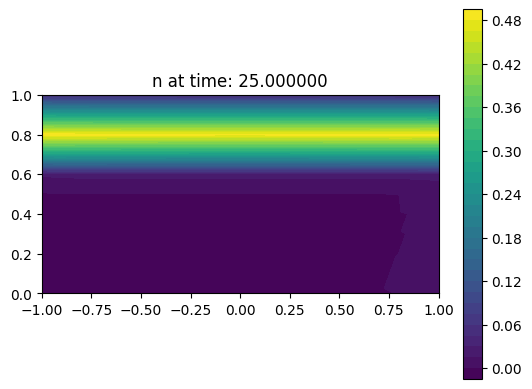

0.2140166962451736


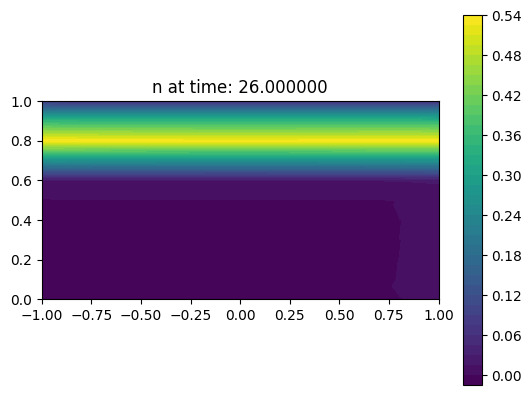

0.23762392270182564


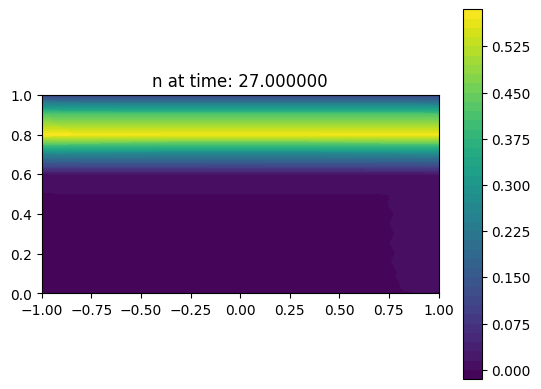

0.2608077502594708


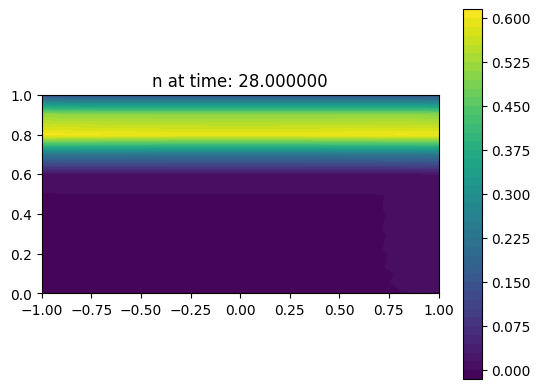

0.2831734181412906


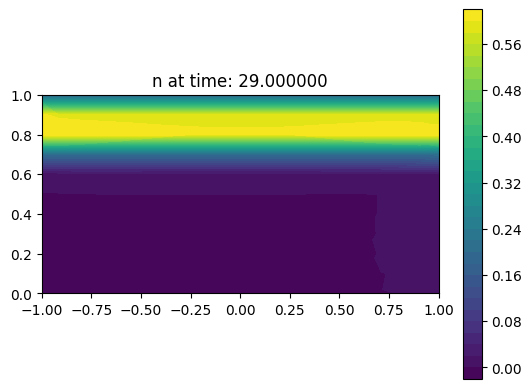

0.30437240631127327


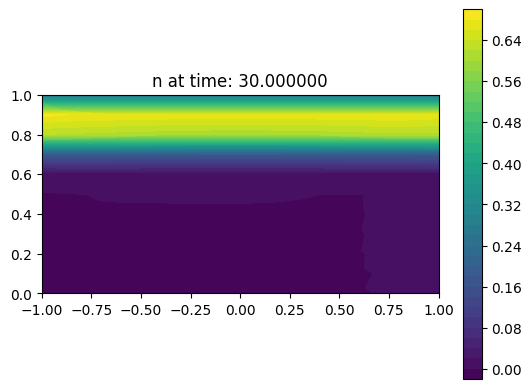

0.32411457992582904


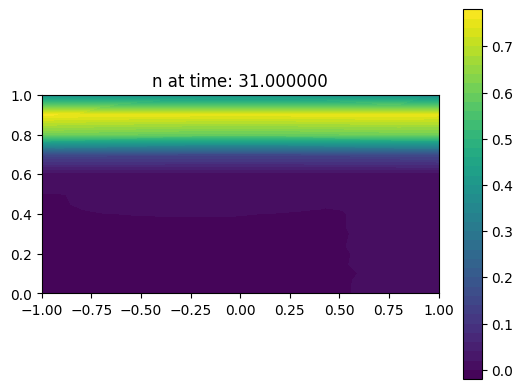

0.34217494804503695


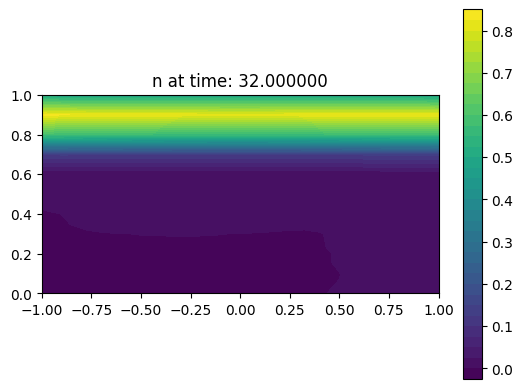

0.3583953899972489


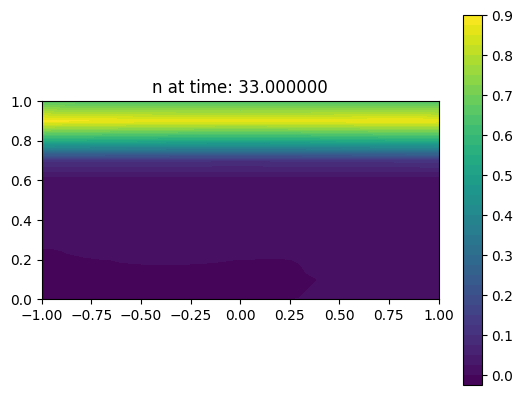

0.3726823069521935


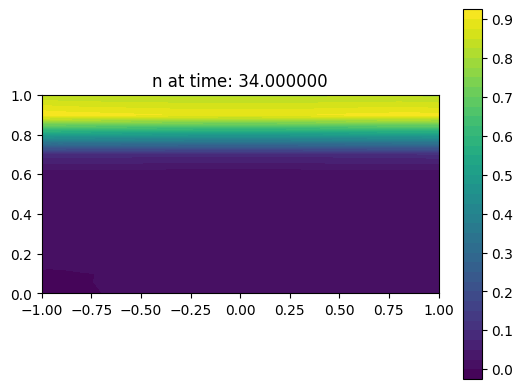

0.3850007582123918


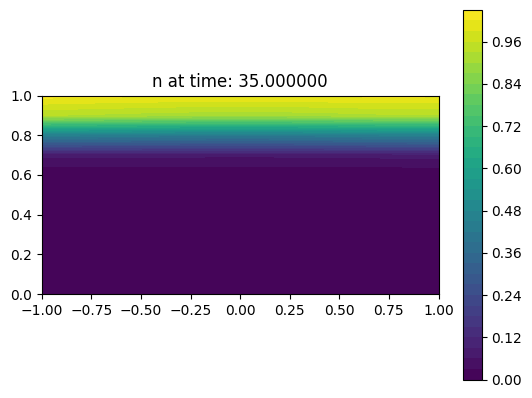

0.39536683429284014


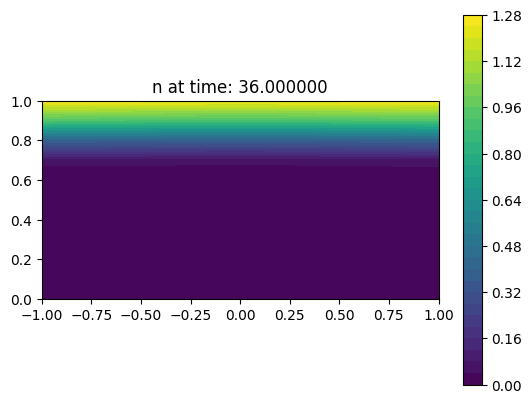

0.4038384254430099


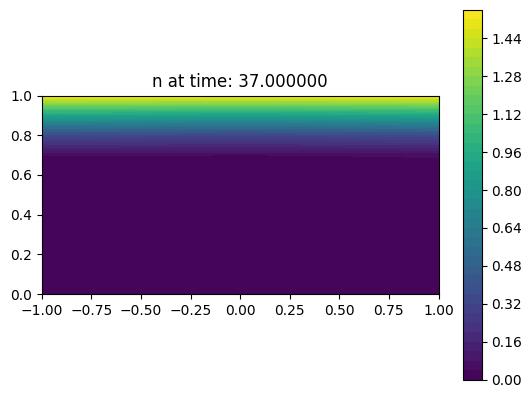

0.41050683761739726


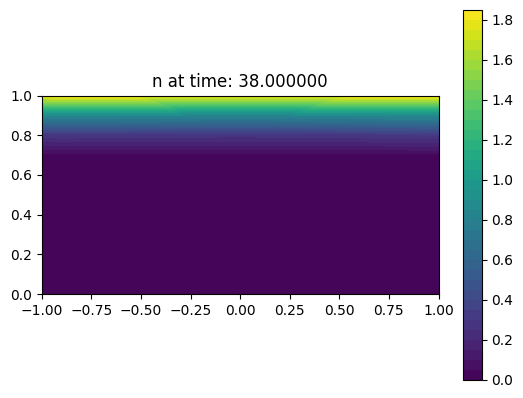

0.4154880942990575


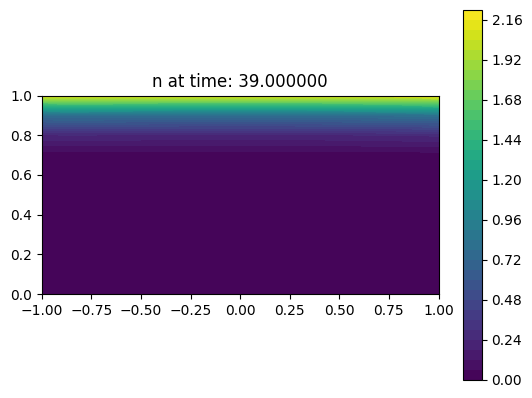

0.4189149578083547


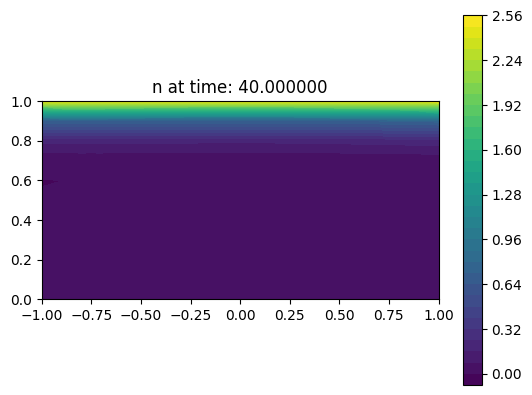

0.42093005225874697


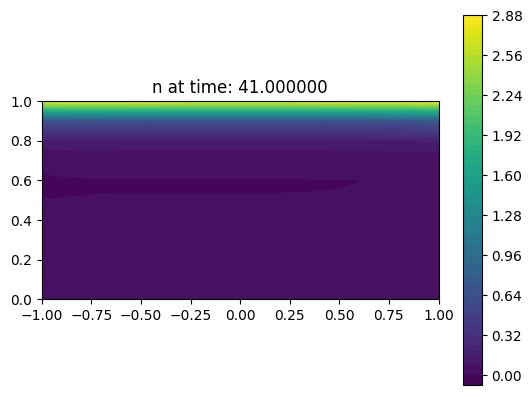

0.42168006408393666


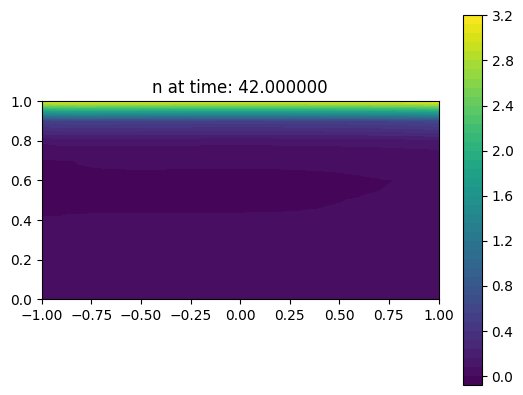

0.4213110144778286


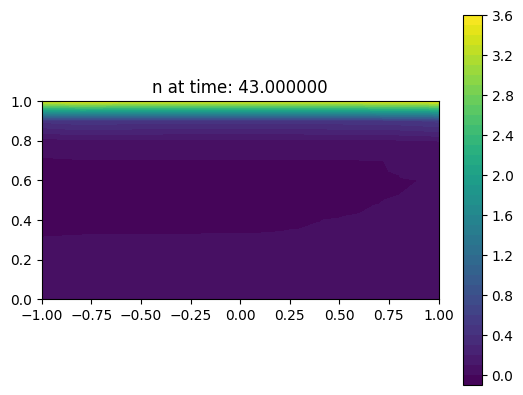

0.41996453961073205


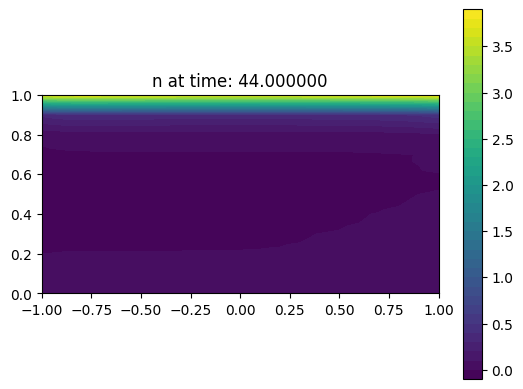

0.41777508249992534


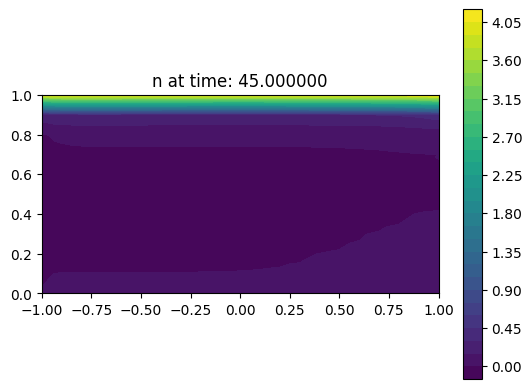

0.4148678867278441


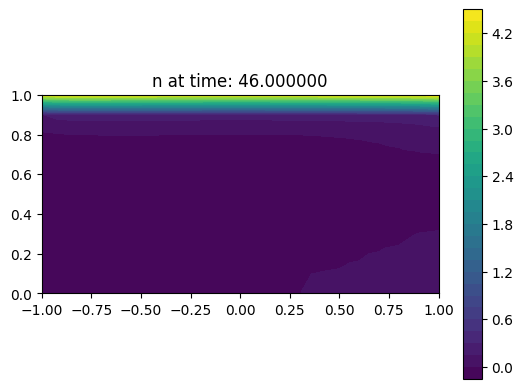

0.4113576800069947


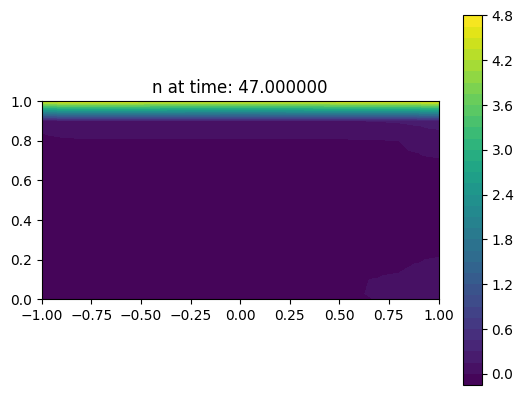

0.4073479398419951


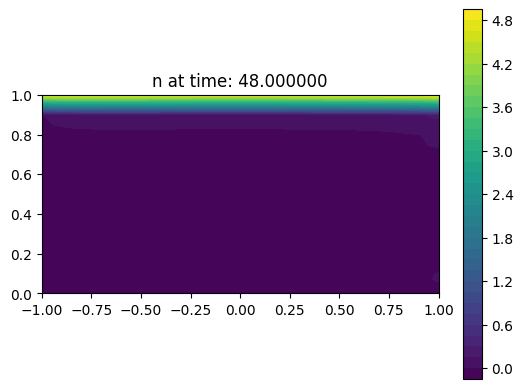

0.40293064086772457


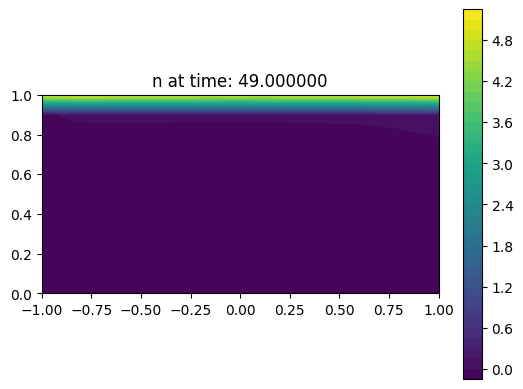

0.398186391855577


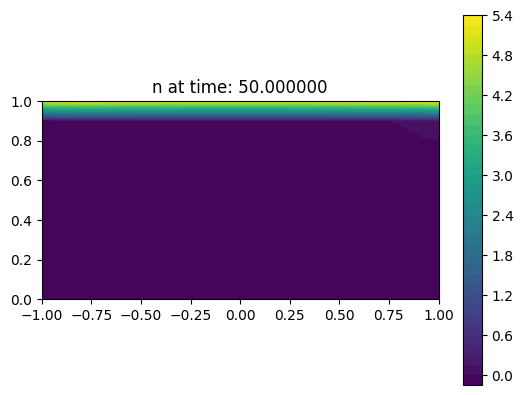

0.3931848788916735


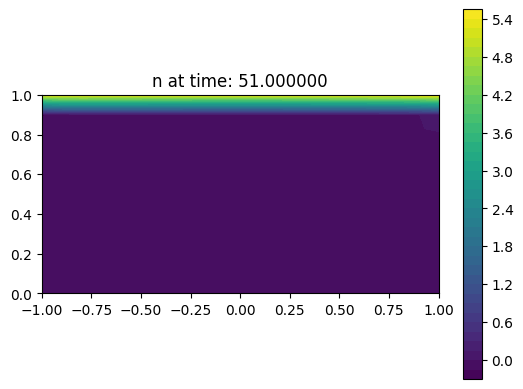

0.38798553950576986


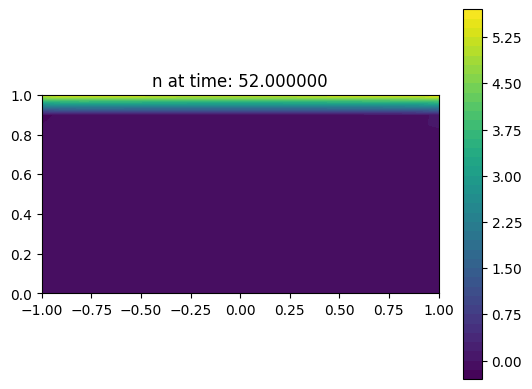

0.3826384005743351


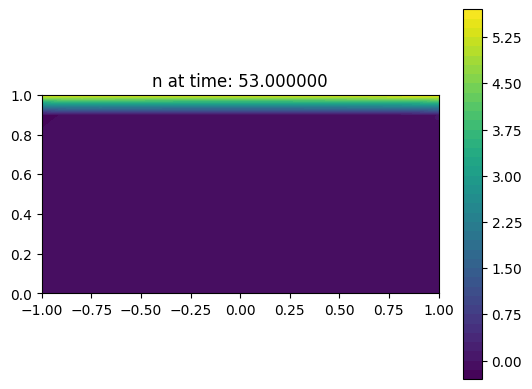

0.37718502075078303


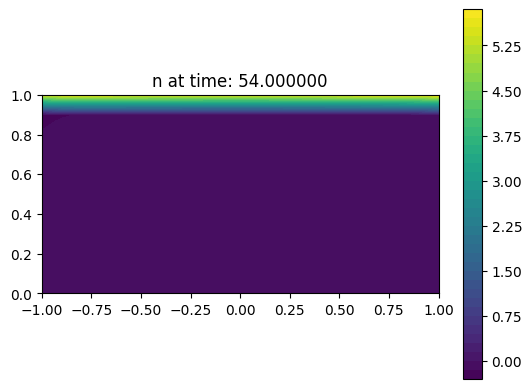

0.37165948606301424


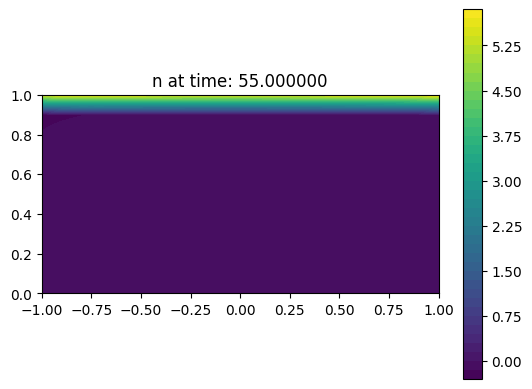

0.3660894151287327


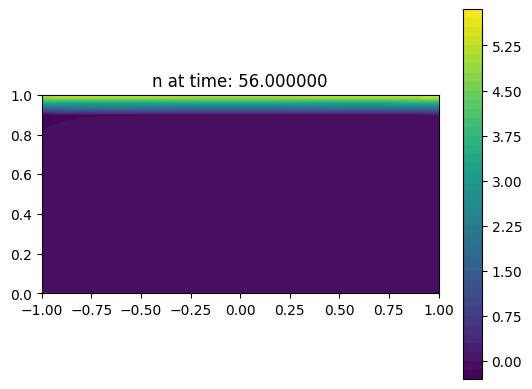

0.360496938037458


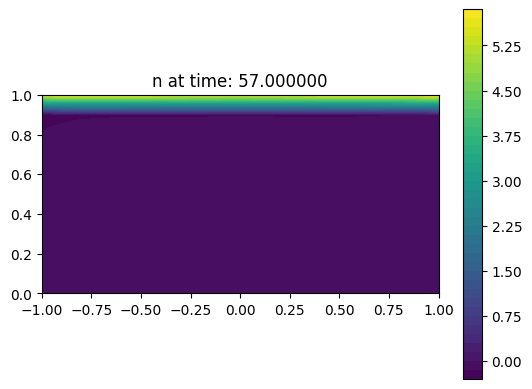

0.35489962015340215


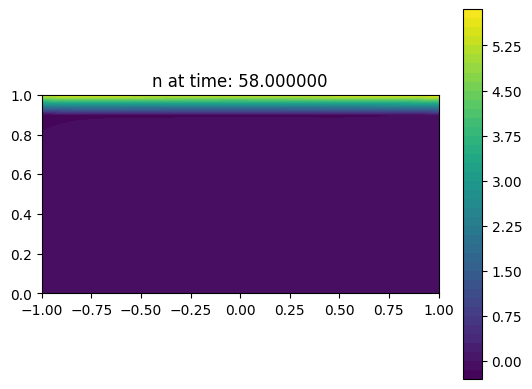

0.3493113087469356


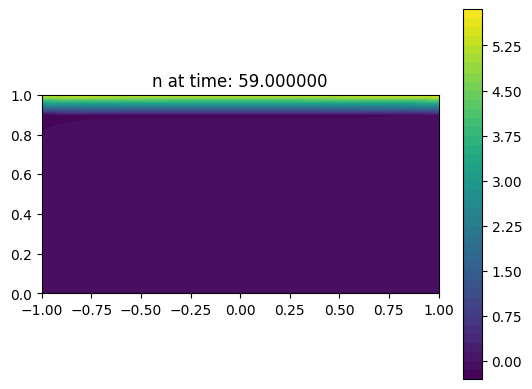

0.34374288638219513


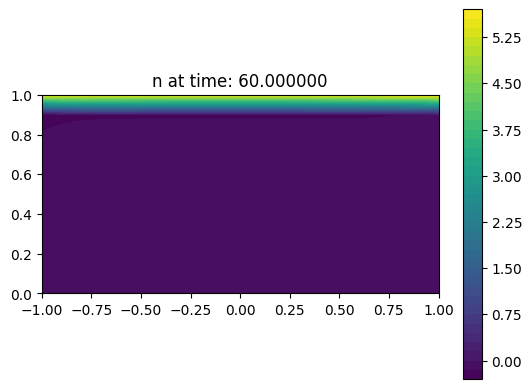

0.338202920386404


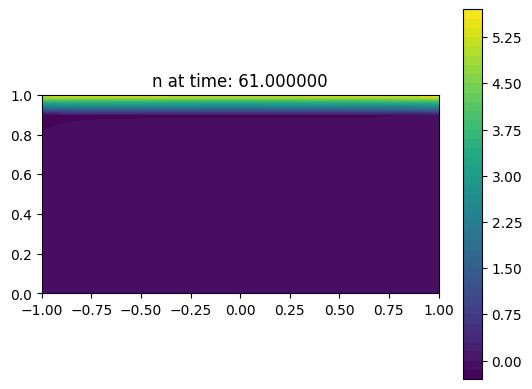

0.33269820258494365


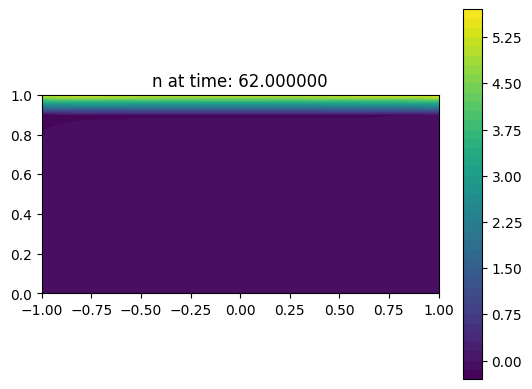

0.32723417790471426


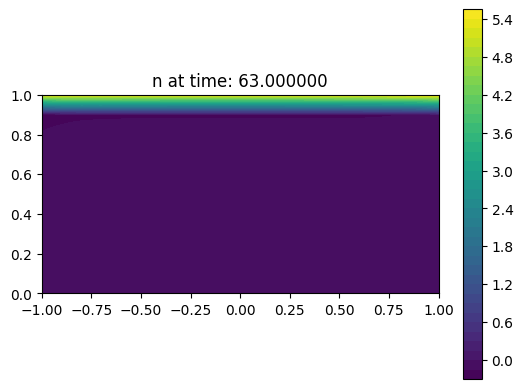

0.32181526448358366


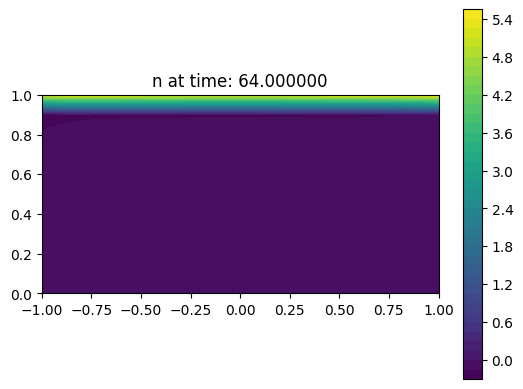

0.31644507154680057


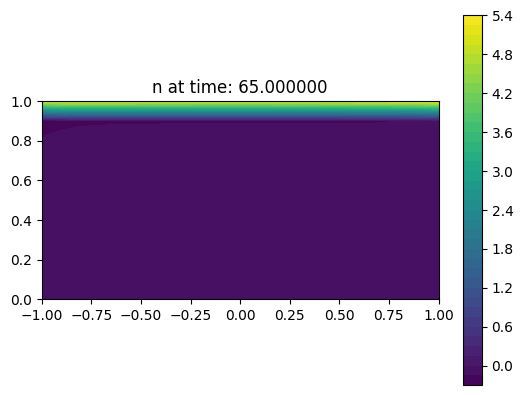

0.3111265244003444


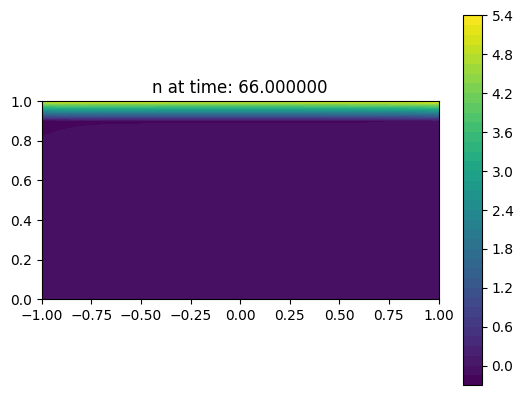

0.3058619082645386


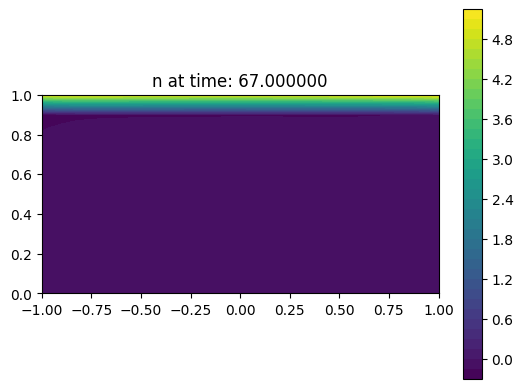

0.3006528441509616


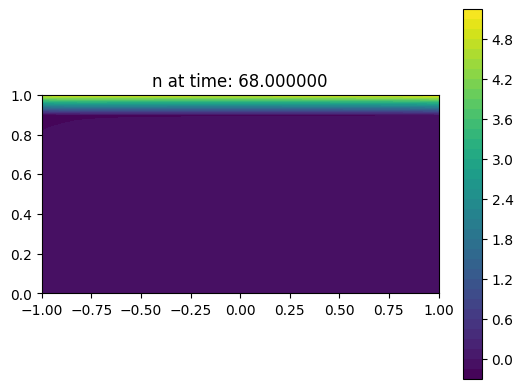

0.29550021047131453


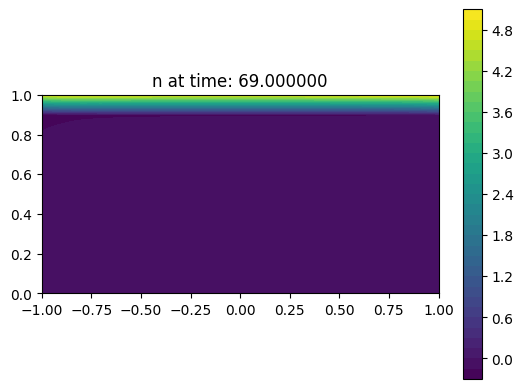

0.29040402359495093


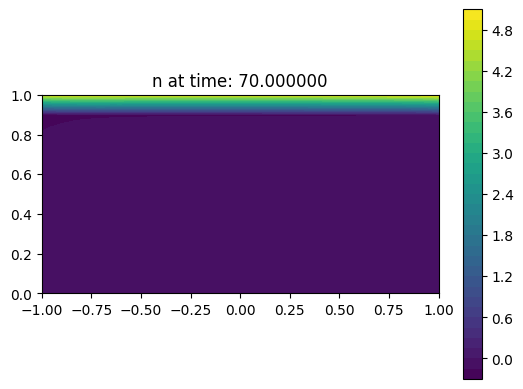

0.2853632893399096


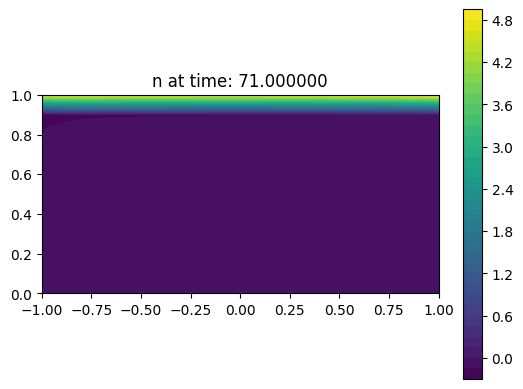

0.28037583572917546


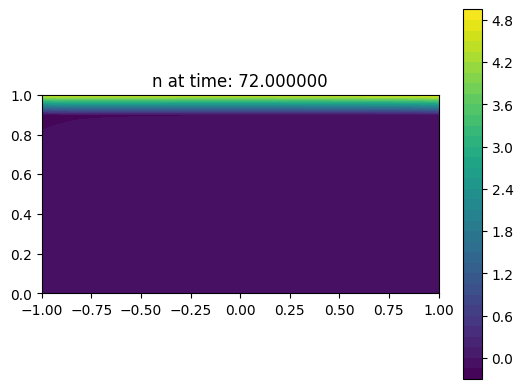

0.2754381356877459


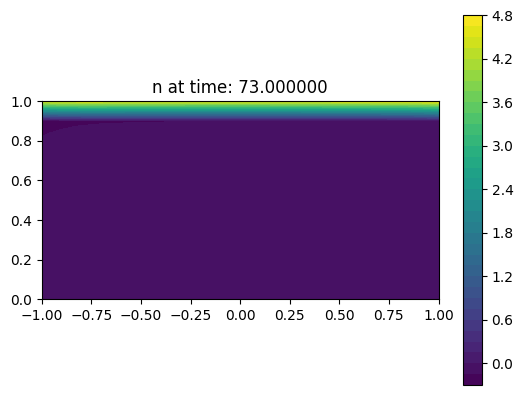

0.2705451271077168


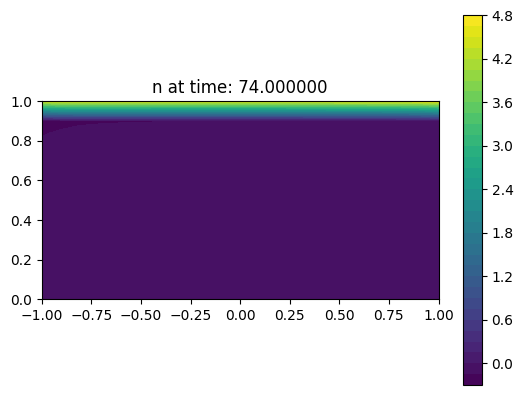

0.2656900371814199


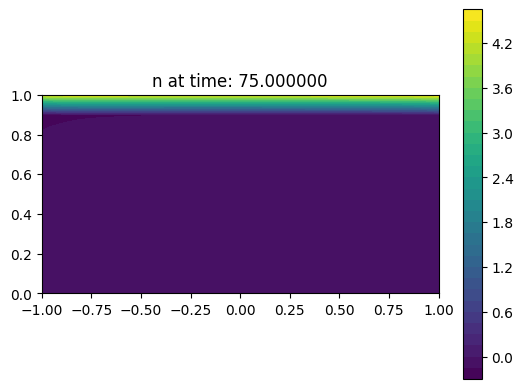

0.26086421824233574


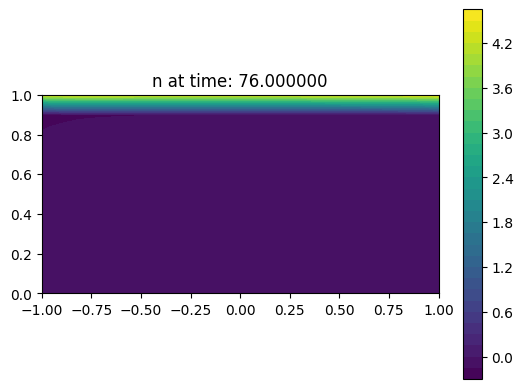

0.2560570035043175


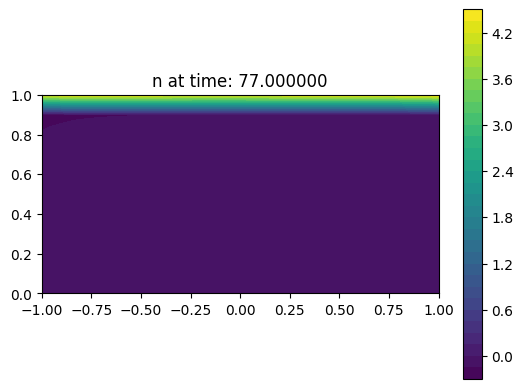

0.25125559280406856


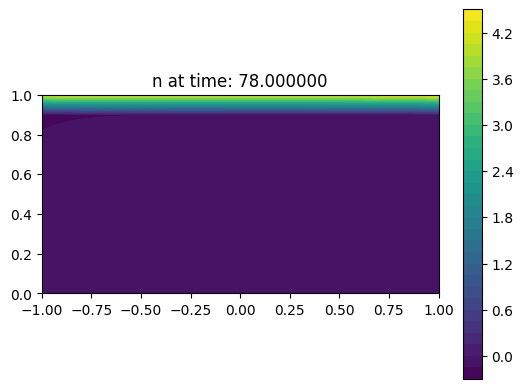

0.24644498033928755


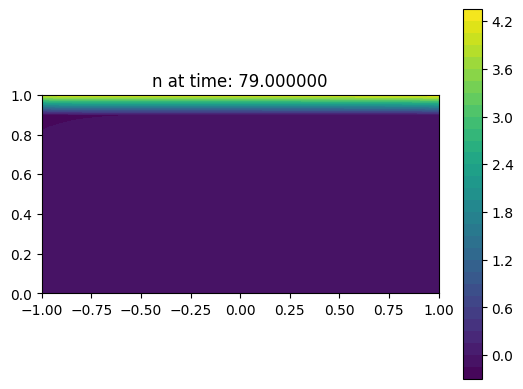

0.24160793799700503


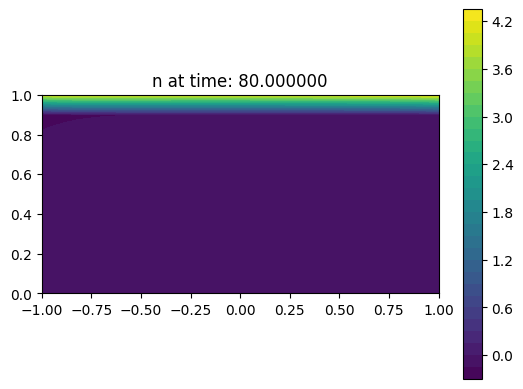

0.23672506874063465


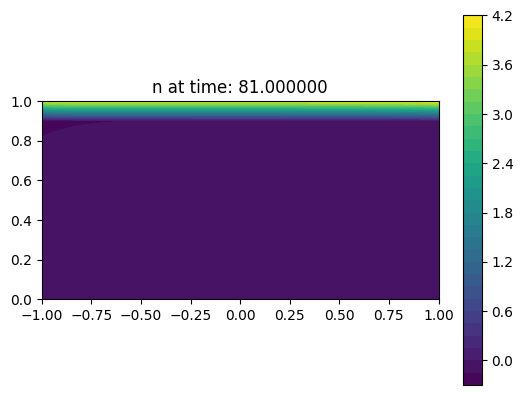

0.2317749443181555


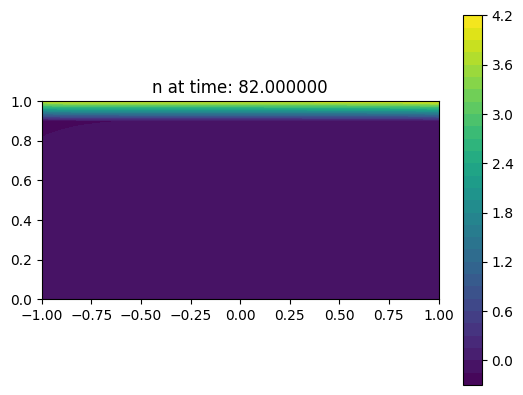

0.2267343400596737


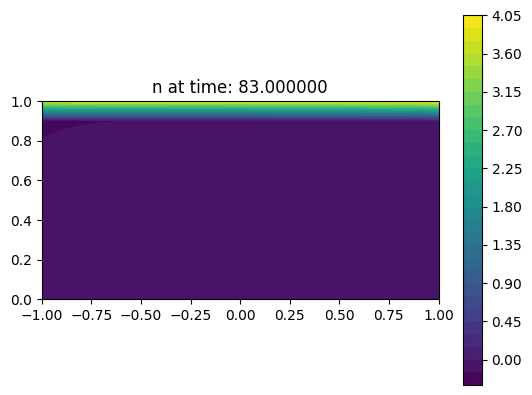

0.221578576711844


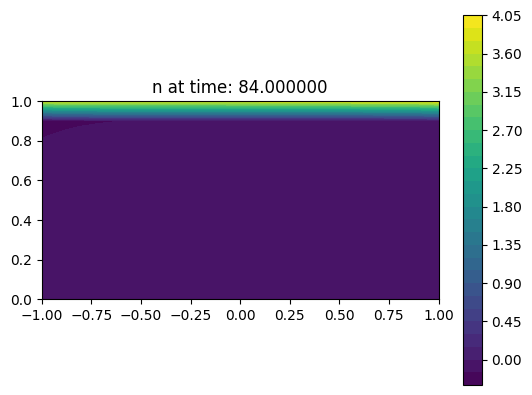

0.21628197523746345


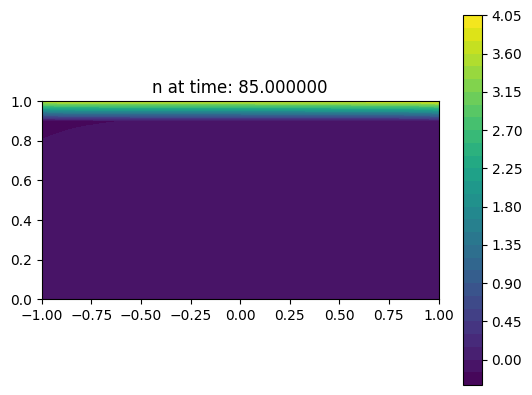

0.2108184255607345


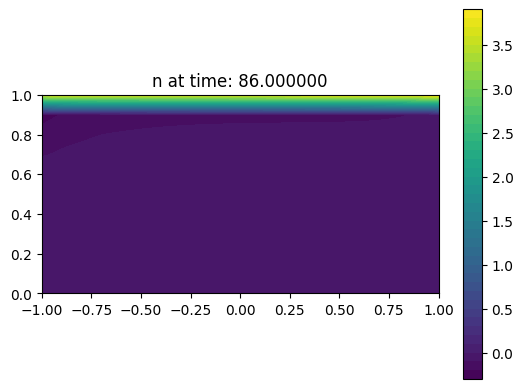

0.2051620647333598


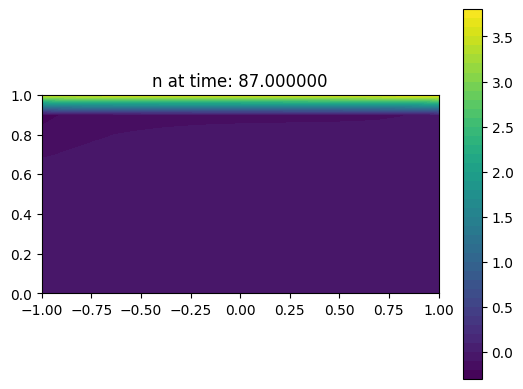

0.1992880543594045


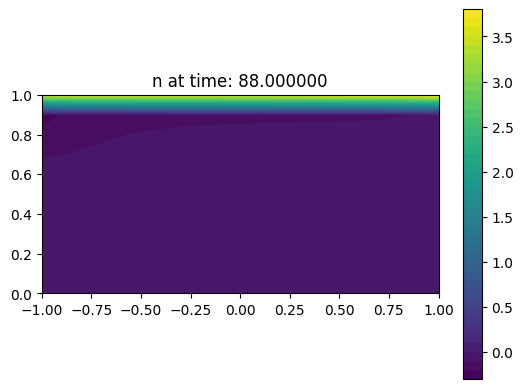

0.19317344178081206


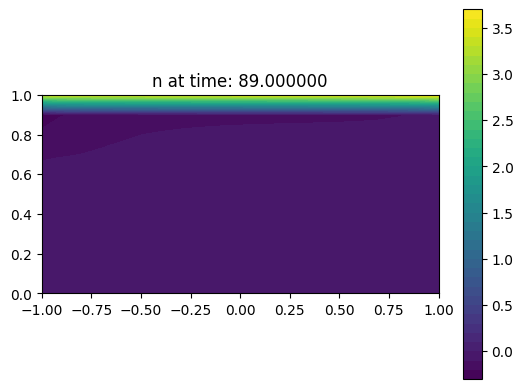

0.18679808488852206


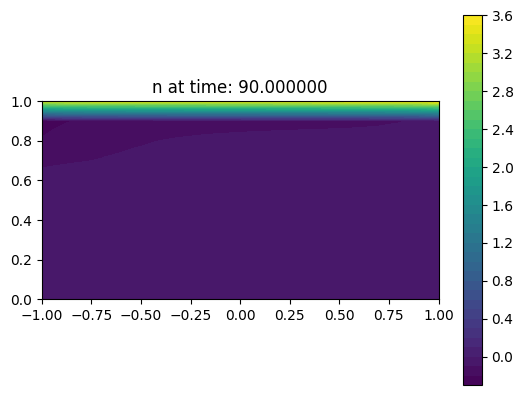

0.18014561681374447


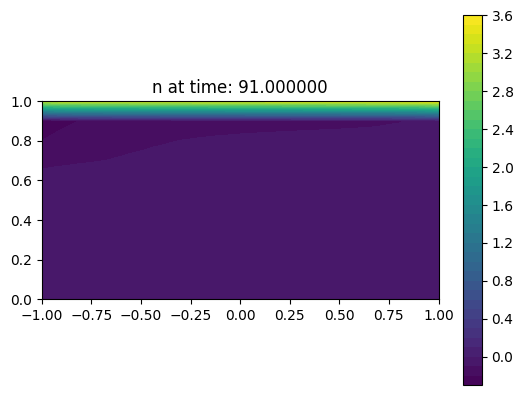

0.1732044244001637


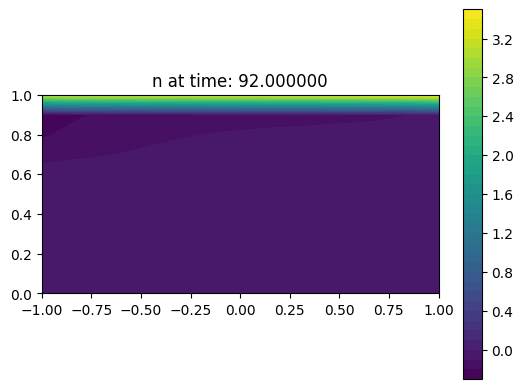

0.16596861337584032


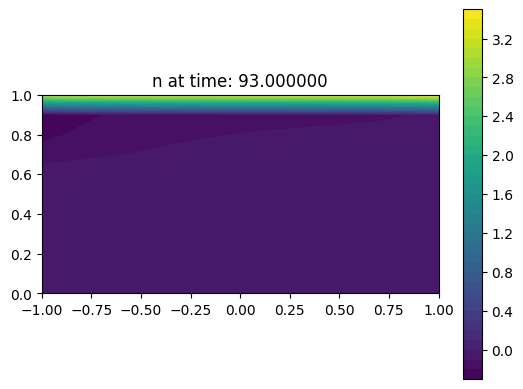

0.1584389335257104


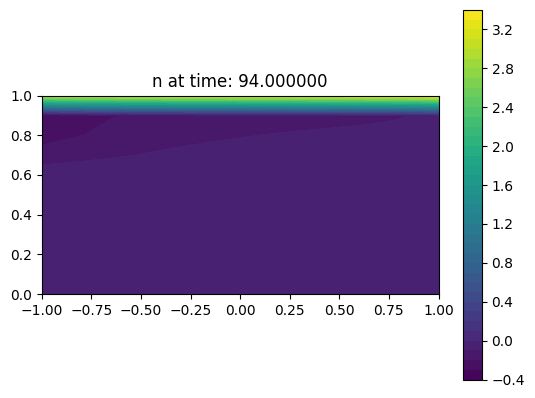

0.15062363878357526


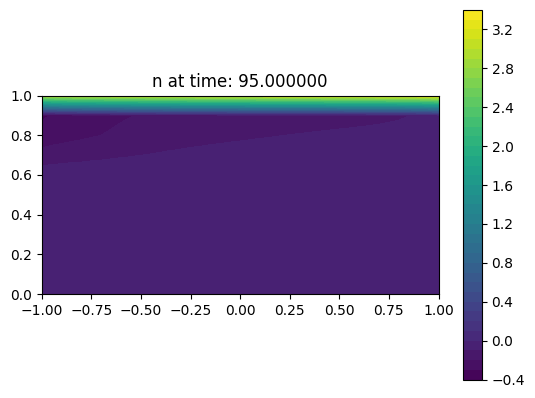

0.14253925977948356


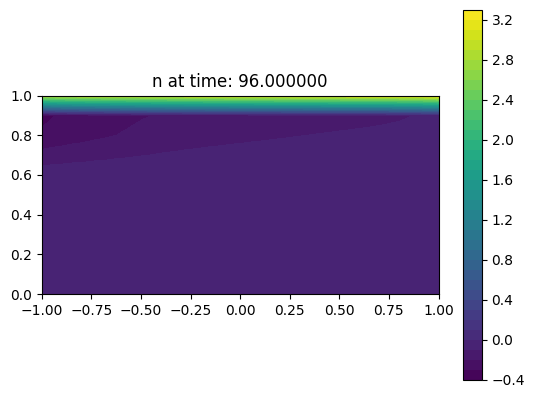

0.13421126967036226


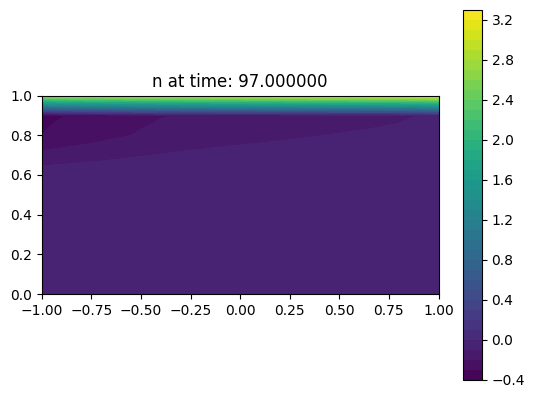

0.125674627666287


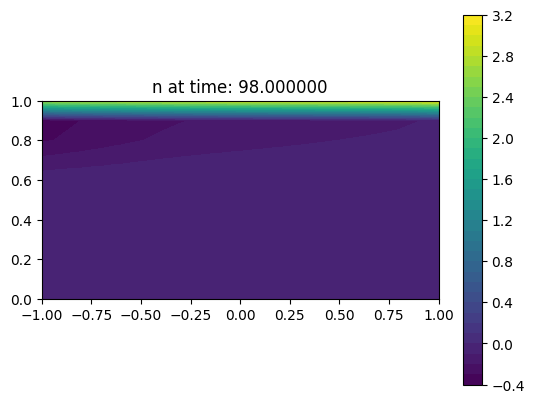

0.11697418813503732


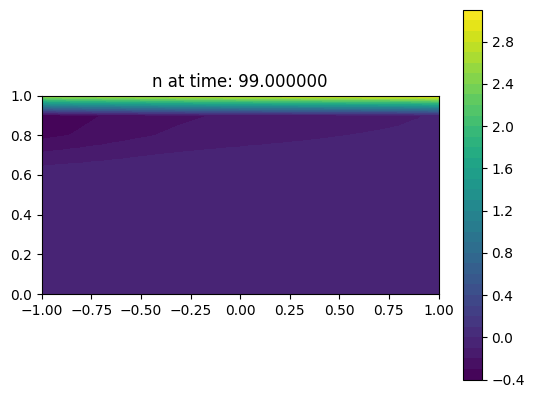

0.1081649661274417


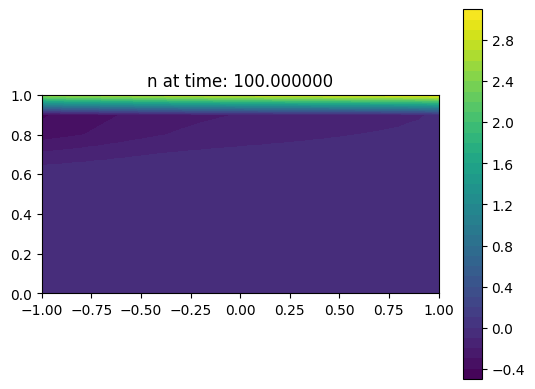

0.09931225226296587


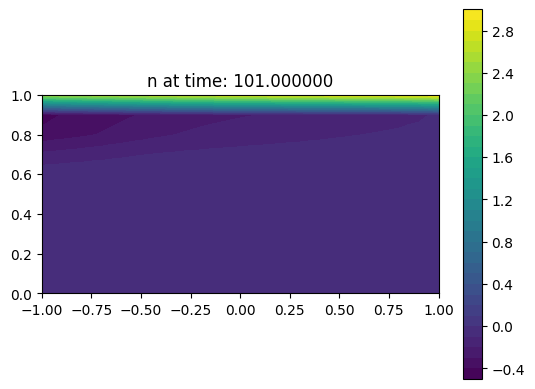

0.09049157086751347


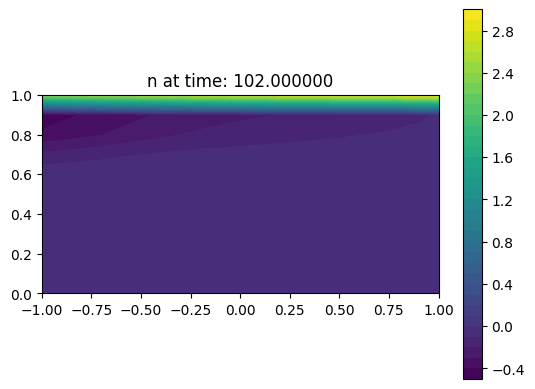

0.08178847487321132


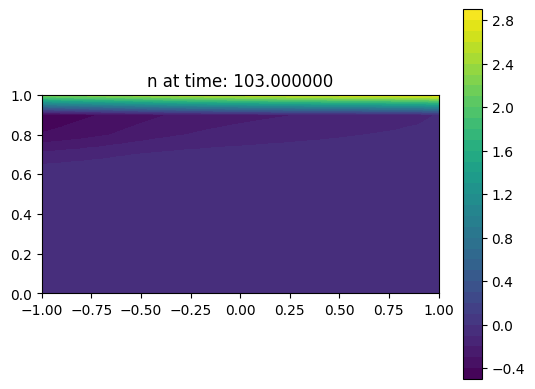

0.07329816918771775


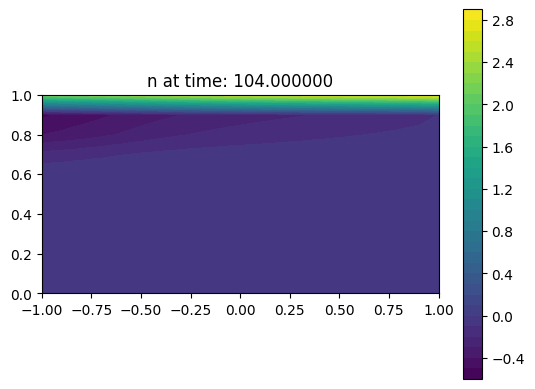

0.06512495104827526


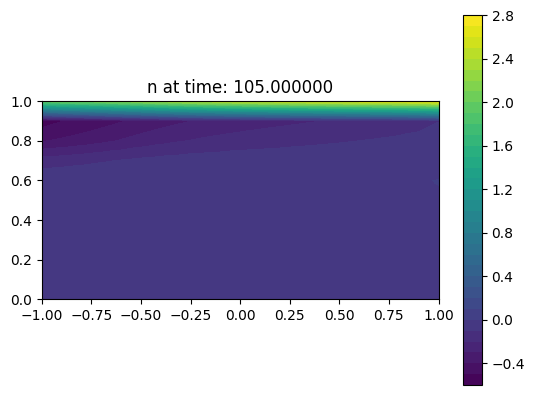

0.05738145145092067


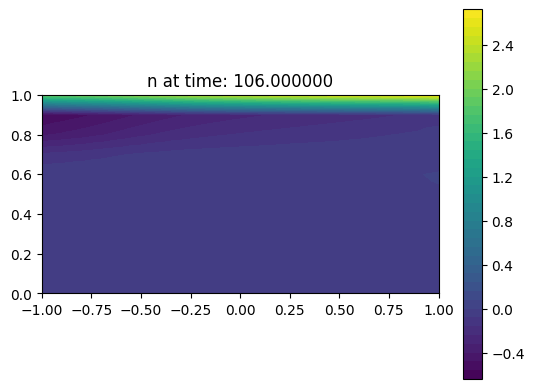

0.05018765639439502


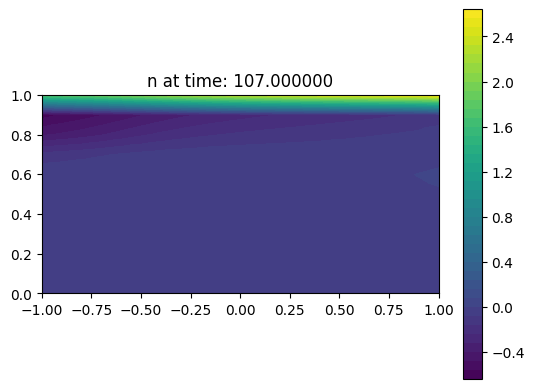

0.04366968089269334


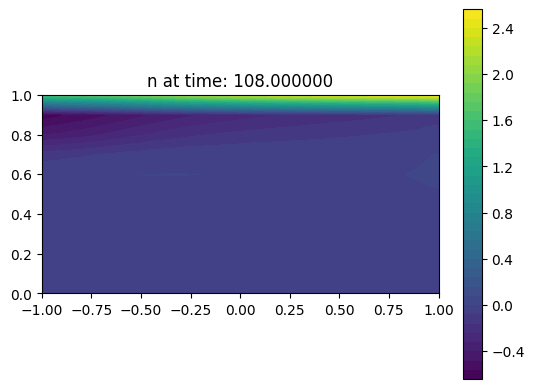

0.03795826322006727


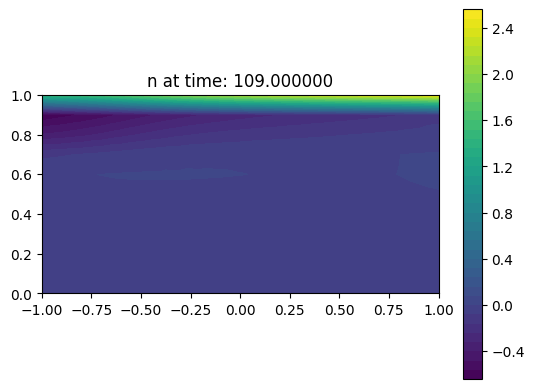

0.03318694269460347


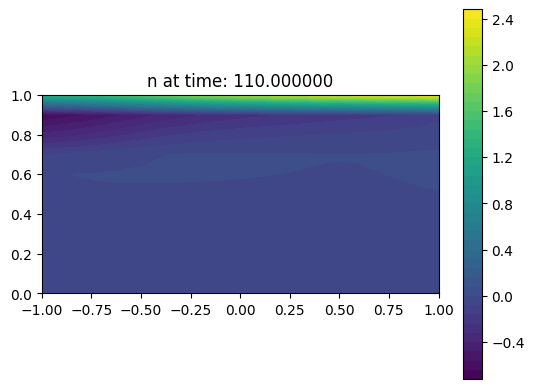

0.02948988289204544


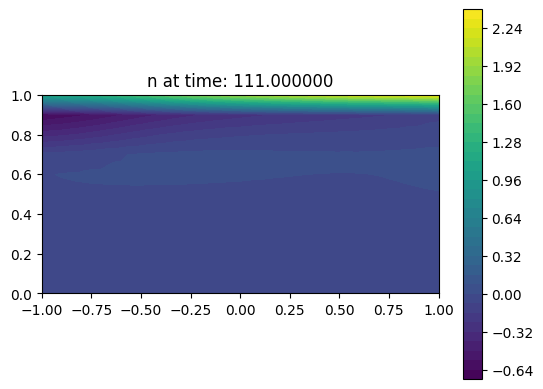

0.026999305331600637


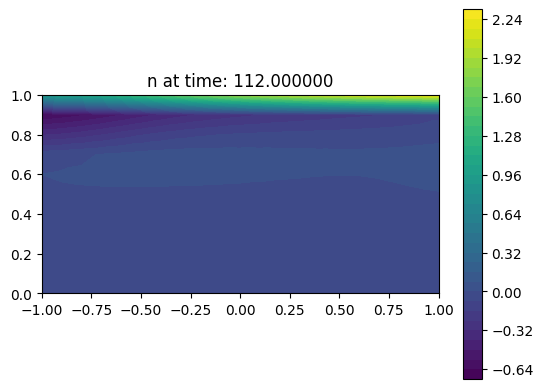

0.02584250858144732


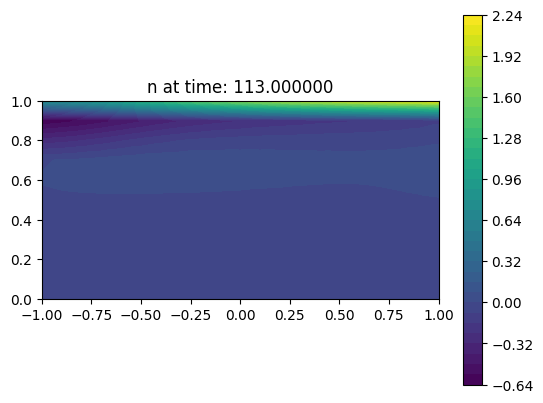

0.026138466775862394


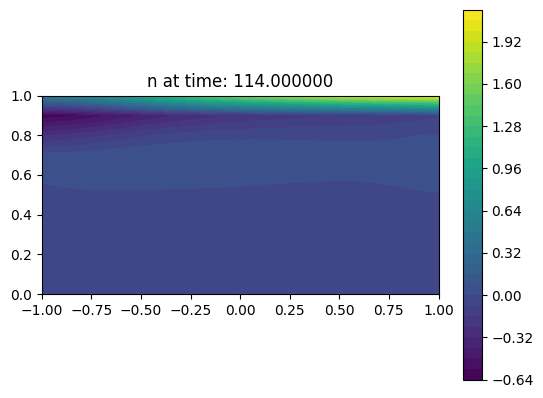

0.027994031907932197


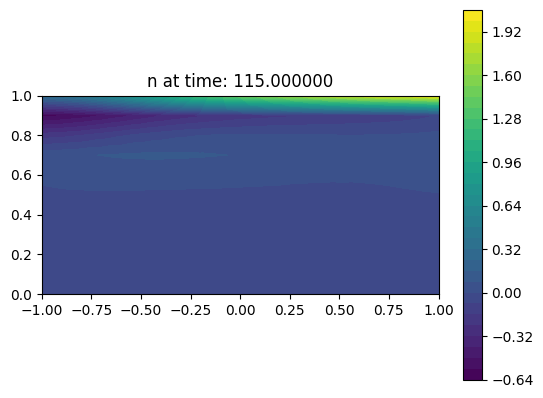

0.031499807323180015


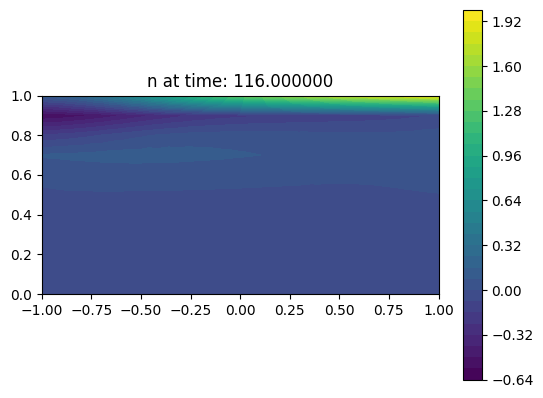

0.03672581524660608


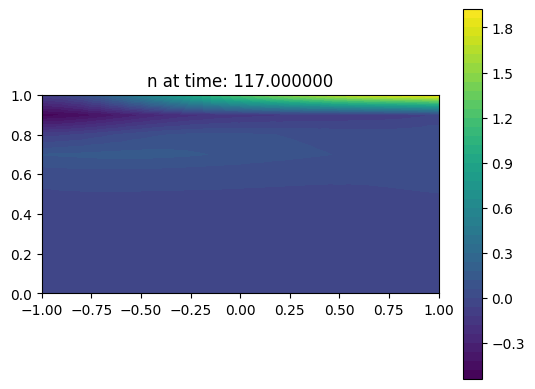

0.043717145877178815


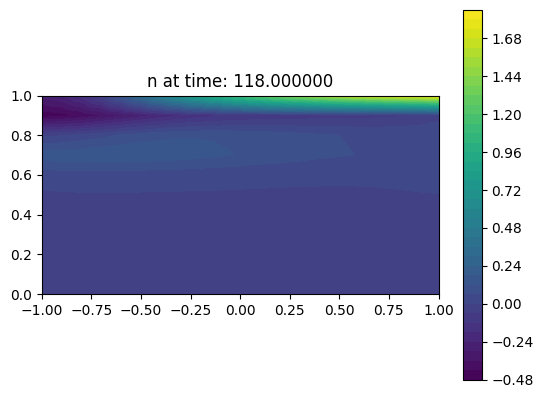

0.05248984295512012


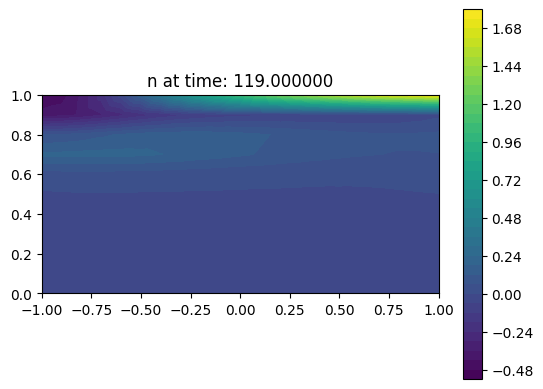

0.06302734023680527


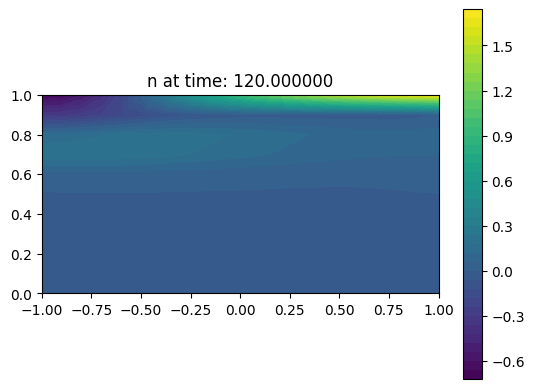

0.0752778013263609


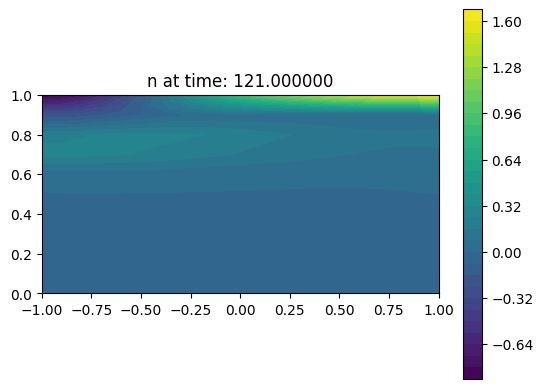

0.0891527005226802


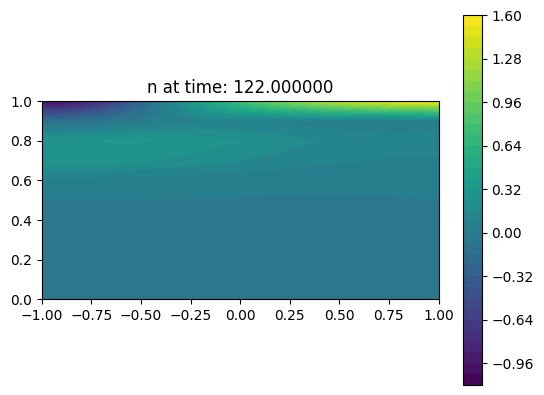

0.10452697943473022


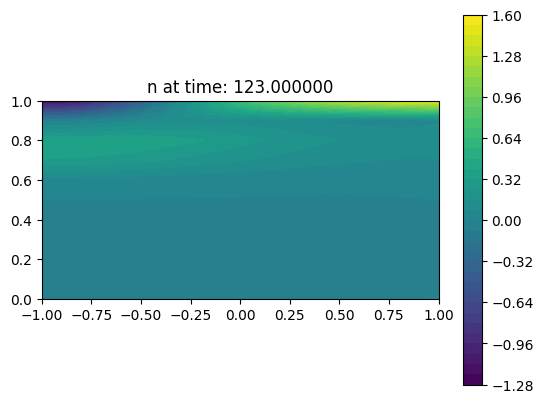

0.12124104482317492


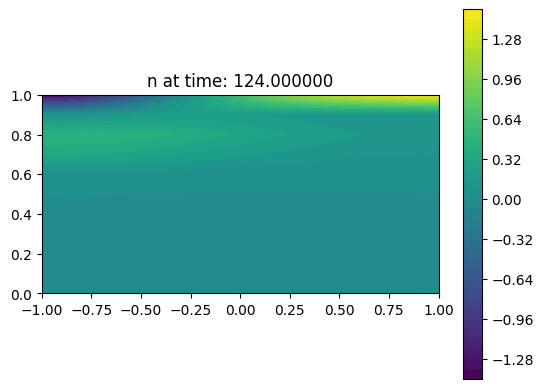

0.13910448196091935


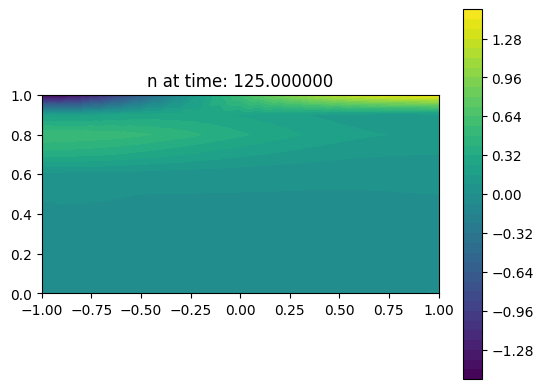

0.15790153620604663


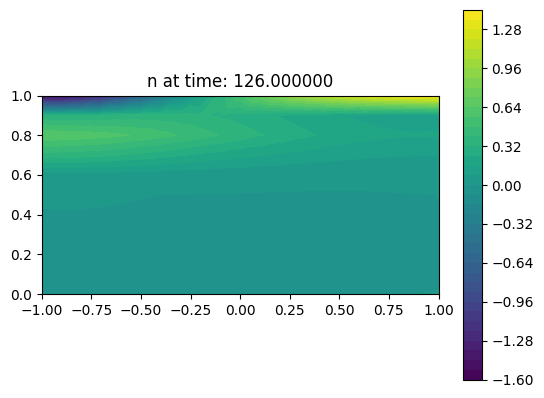

0.17739799925825267


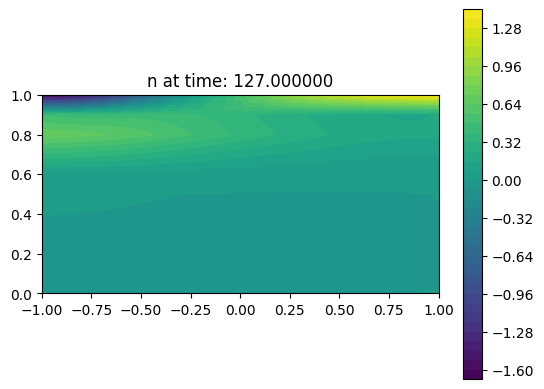

0.19734903425656117


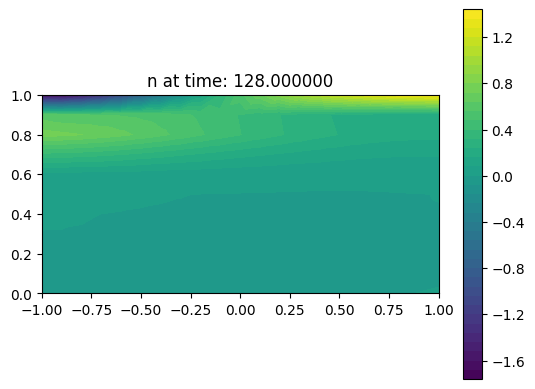

0.21750738514303994


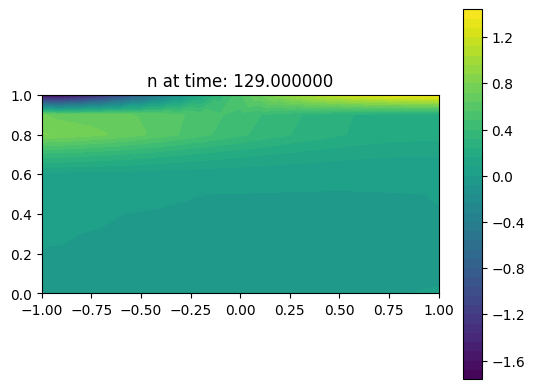

0.23763138553987923


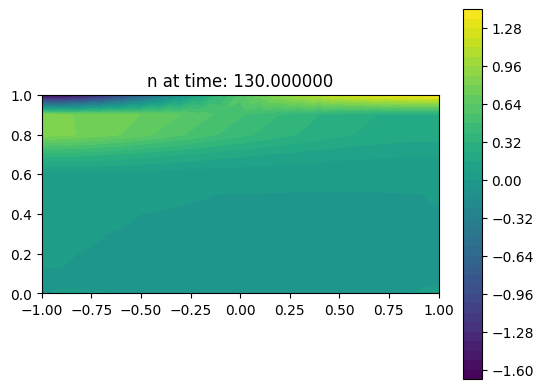

0.25749223291888207


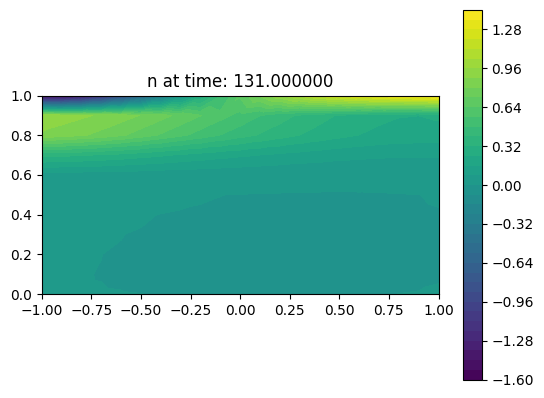

0.27688010627905035


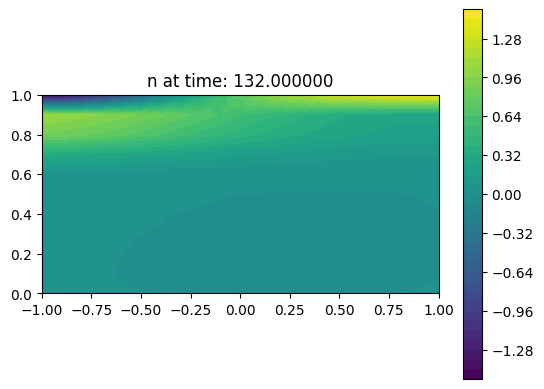

0.29560885550667126


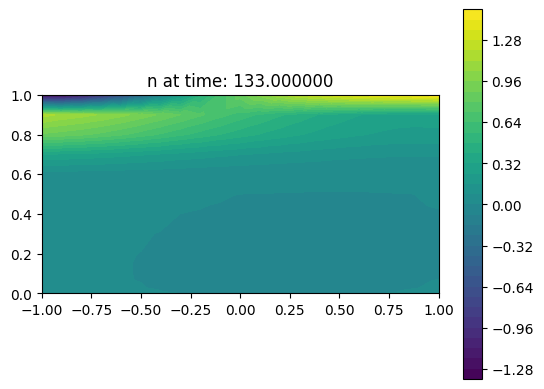

0.3135191500992382


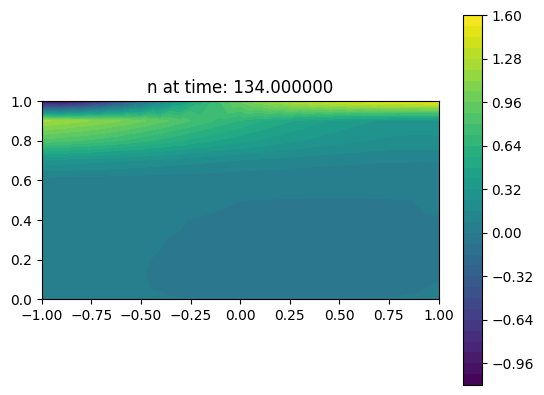

0.3304801193427013


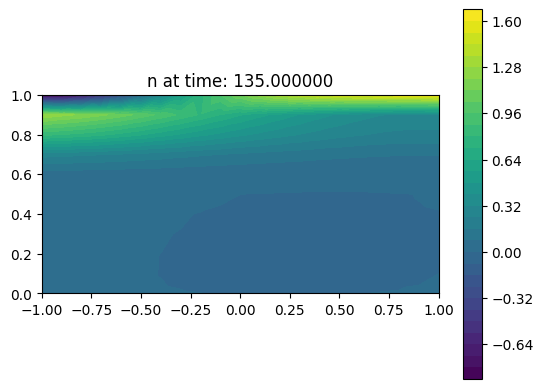

0.34638962864232664


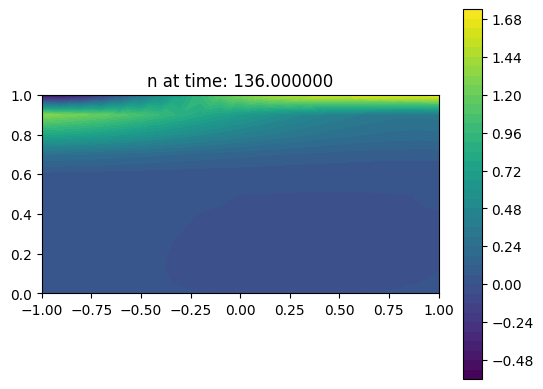

0.36117348835566343


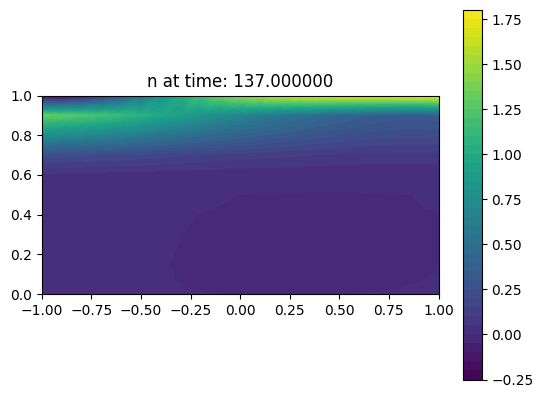

0.37478379416030366


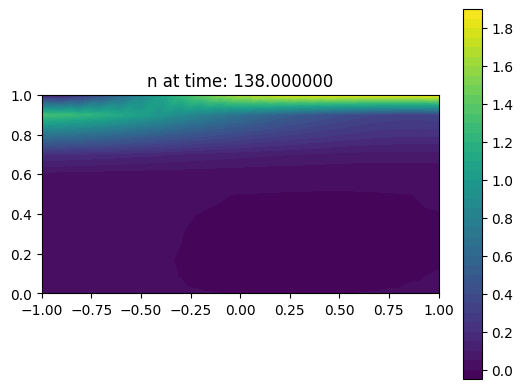

0.3871958026529833


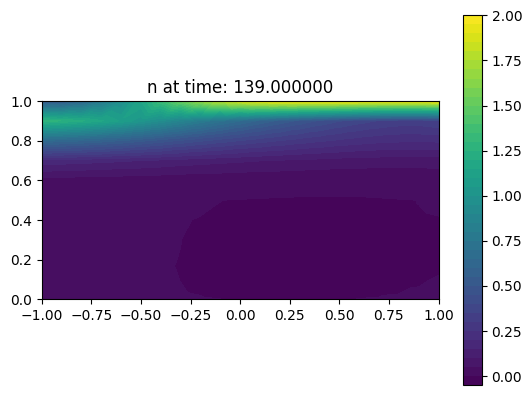

0.39840617590032


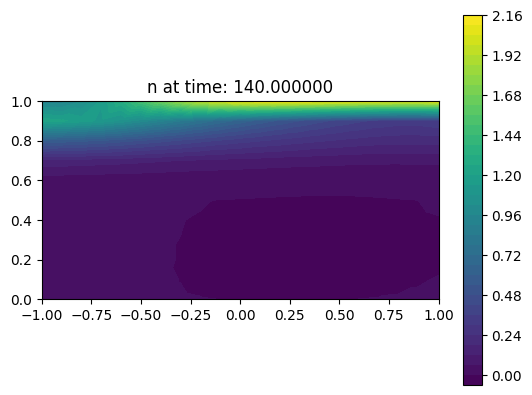

0.40842947579057


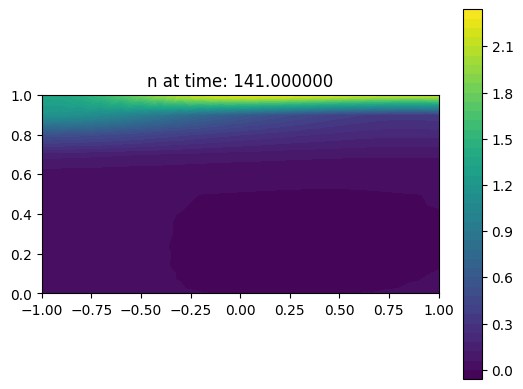

0.417294658485826


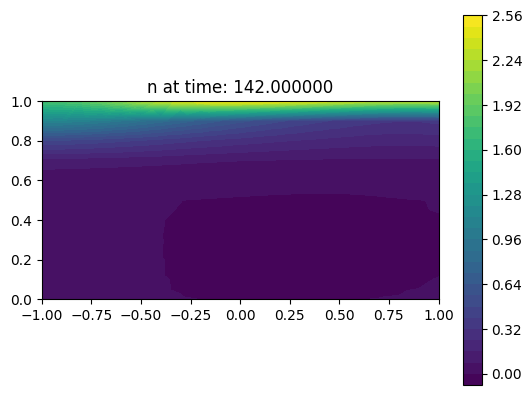

0.4250430658138113


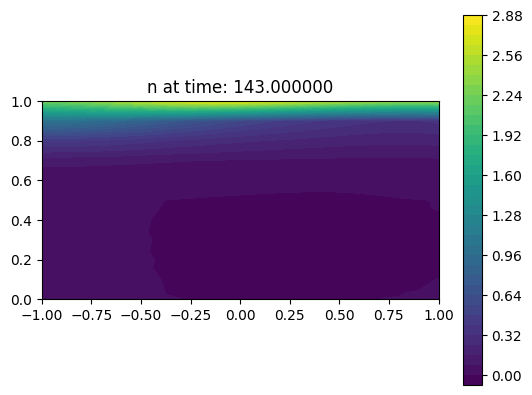

0.4317253670056117


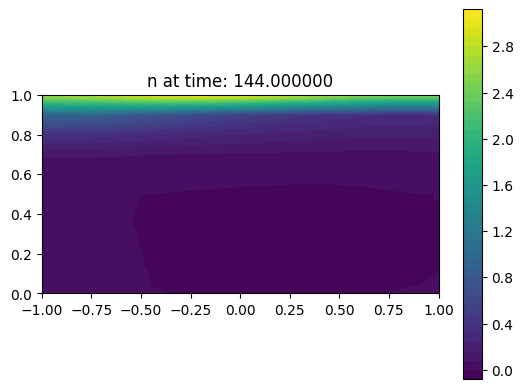

0.4373991008850725


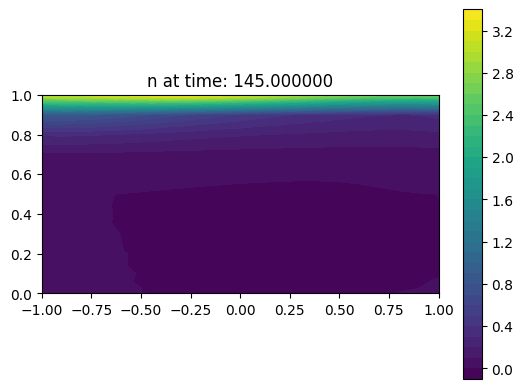

0.44212650161800987


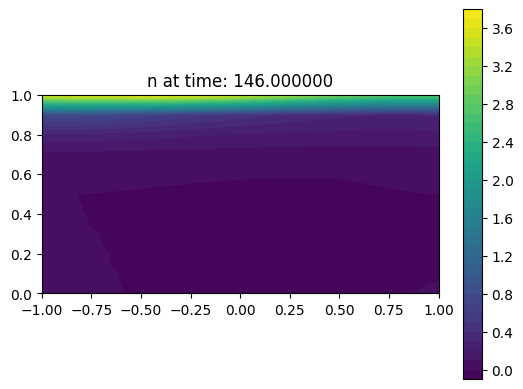

0.445972617612649


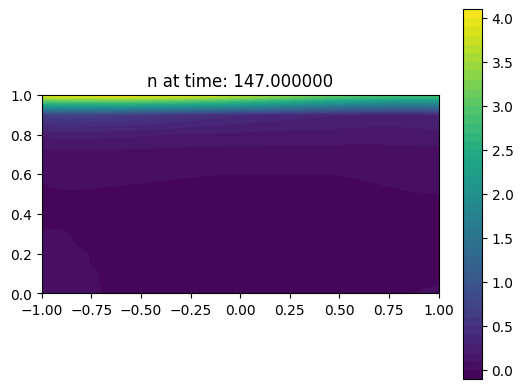

0.4490037192206719


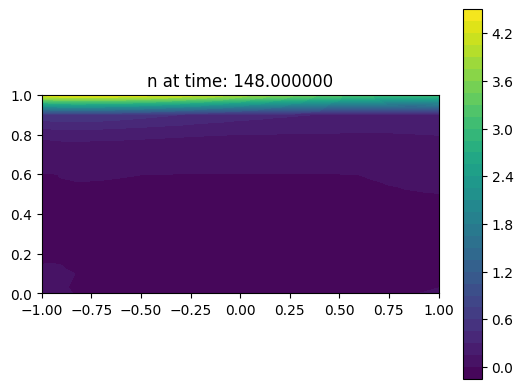

0.4512859802090561


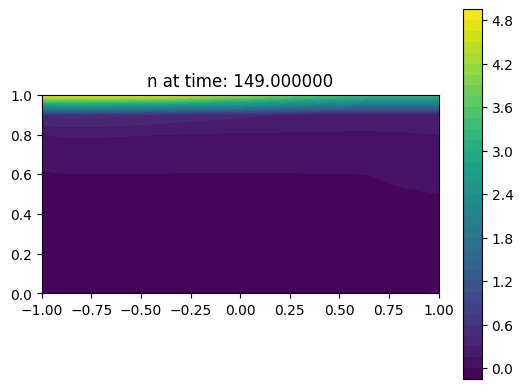

0.4528844110974227


In [8]:
V = FunctionSpace(mesh,"P",2)
n = Function(V)
nfile = XDMFFile('solutions/non_sym/N1e-4.xdmf')
for i in range(int(T/dt/save_interval)):
    nfile.read_checkpoint(n,"n",i)
    sol = plot(n)
    plt.colorbar(sol)
    plt.title('n at time: %f' %(i*save_interval*dt) )
    plt.show()
    print(assemble(n*dx))

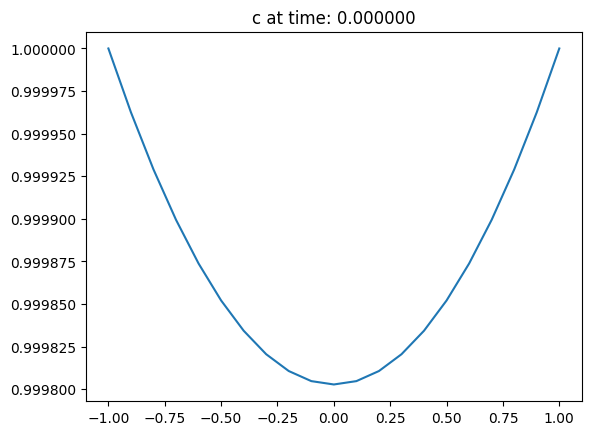

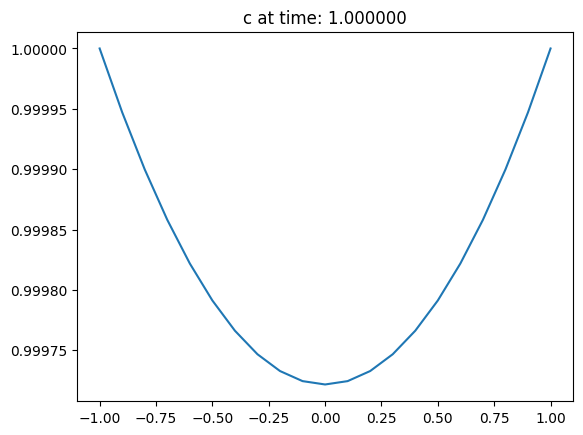

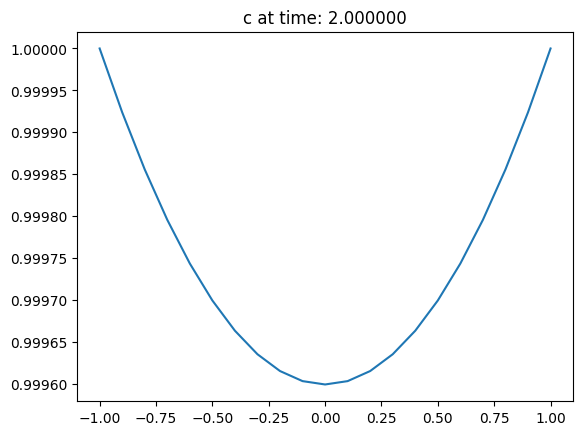

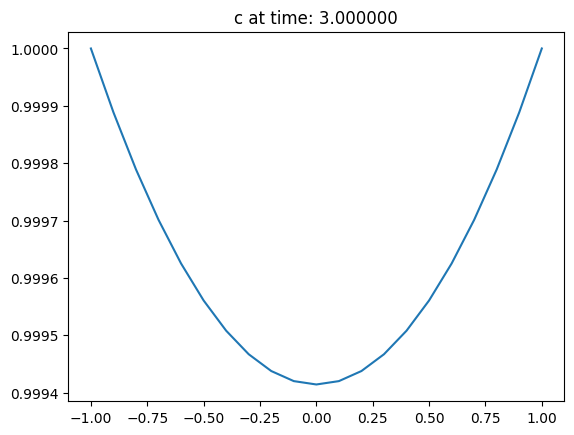

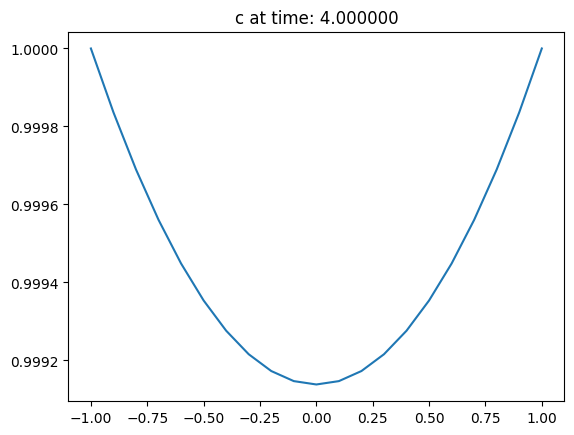

...

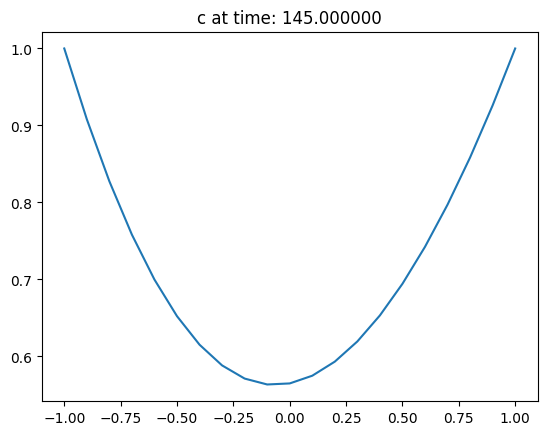

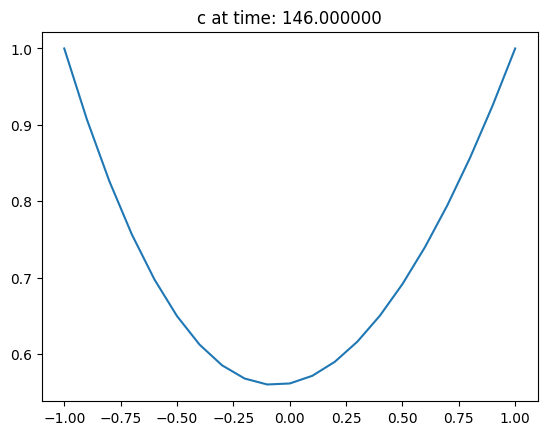

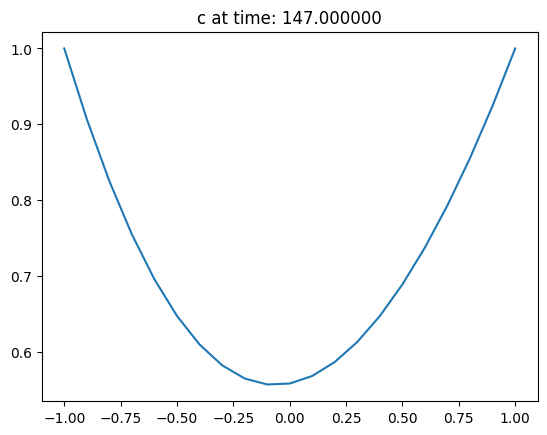

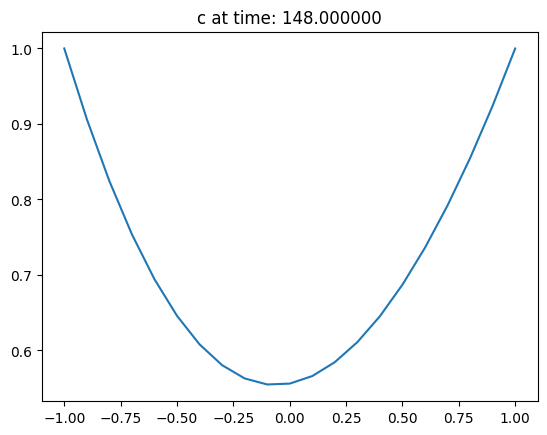

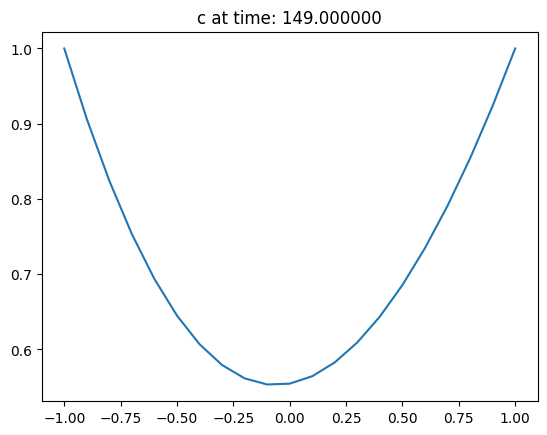

In [9]:
c = Function(V)
mesh1D = IntervalMesh(20,-1,1)
V1D = FunctionSpace(mesh1D,'CG',1)
cfile = XDMFFile('solutions/non_sym/C1e-4.xdmf')

for i in range(int(T/dt/save_interval)):
    cfile.read_checkpoint(c,"c",i)
    c1D = interpolate(c,V1D)
    sol = plot(c1D)
    plt.title('c at time: %f' %(i*save_interval*dt) )
    plt.show()